# Leveraging Twitter Data in the Airline Industry: How to More Efficiently Identify Customer Sentiment Using NLP and Machine Learning 
###### Flatiron School Capstone Project
##### Doug Steen

# Abstract

Twitter is one of the world's most popular social media platforms, with roughly 330 million active users worldwide as of 2019 (https://www.oberlo.com/blog/twitter-statistics). Since Twitter allow users to quickly and concisely make statements or ask questions about a specific topic, tweets can be an invaluable information source for companies to learn from customer statements about a product or service.

Text data is being increasingly used to learn about customers through Natural Language Processing (NLP). NLP allows for the numerical representation of text data, which is critical for any machine learning (ML) applications that utilize text data. Today, Twitter is one of the richest publicly available sources of such text data.

This project explores the applications of NLP and ML text classification to Twitter users discussing the airline industry. Specifically, I aim to address the following questions: (1) Which combination of classification algorithm and vectorization method performs best for classifying an airline-related tweet as positive, negative, or neutral? (2) How accurately can this classification be made? (3) Can a large quantity of unlabeled tweets be used in an unsupervised manner to improve classification accuracy for a smaller quantity of labeled tweets?

To answer these questions, I first obtain (1) ~14.6 k airline-related tweets labeled as positive, negative, or neutral (https://www.kaggle.com/crowdflower/twitter-airline-sentiment), and  (2) ~41.5 unlabeled airline-related tweets (https://developer.twitter.com/en). I then develop classification algorithms using multiple NLP vectorization methods (TF-IDF, Doc2Vec, GloVe, GloVe + Doc2Vec) and ML classification algorithms (LinearSVC, Random Forest, Multinomial Naïve Bayes, Adaboost, XGBoost, Neural Network).

A classification accuracy of 89% is achieved using two different techniques: (1) Neural network classifier using GloVe 200d pre-trained word embeddings, and (2) LinearSVC classifier using both GloVe 200d and Doc2Vec embeddings as features.

The addition of ~41.5 k unlabeled tweets while training the unsupervised Doc2Vec embeddings does generally improve classification accuracy when compared to training Doc2Vec on the ~14.6 k labeled tweets alone. However, using Doc2Vec embeddings together with GloVe mean embeddings (GloVe + Doc2Vec) as feature inputs generally does not improve classification accuracy when compared to using GloVe embeddings alone. This is likely due to the fact that GloVe word embeddings are pre-trained on a corpus of tweets several orders of magnitude larger than the dataset used to train Doc2Vec in this study, and therefore the information added by Doc2Vec embeddings is negligible.


# Purpose

Why would we want to apply NLP and machine learning classification to tweets about the airline industry? An efficient and accurate tweet classification system could offer the following advantages:

    -Negative tweets can be identified and addressed by appropriate customer service teams
    
    -Positive tweets can be identified and showcased, used to learn what is 'being done right'
    
    -Questions contained within tweets can be identified and addressed by customer service teams
    
    ...and so on.

##### This project aims to address the following questions using NLP and ML classification techniques:

1. Which combination of classification algorithm and vectorization method performs best for classifying an airline tweet as positive, negative, or neutral?


2. How accurately can this classification be made ?


3. Can a large amount of unlabeled tweets be used to improve classification accuracy for a labeled tweets?

# Dataset

##### 14.6k airline-related tweets labeled as Positive, Negative, Neutral (February 2015)

https://www.kaggle.com/crowdflower/twitter-airline-sentiment

###### 41.5 k unlabeled airline-related tweets (Mar – Feb 2020)

https://developer.twitter.com/en

See ```twitter_30_day_premium_api_call_all_airlines.ipynb``` in this repository for code used to obtain unlabeled tweets from the Twitter Developer API.

# NLP Vectorization Methods

###### TF-IDF Vectorization

Term Frequency-Inverse Document Frequency (TF-IDF) is a technique used to vectorize words in a corpus of documents. TF-IDF is based on the idea that rare words contain more valuable information for classification than commonly occurring words in the documents. TF-IDF is the product of Term Frequency (TF) and Inverse Document Frequency (IDF), given by the equations below:

$$\large TF(t)=\frac{𝑛𝑢𝑚𝑏𝑒𝑟\:𝑜𝑓\:𝑡𝑖𝑚𝑒𝑠\:𝑡\:𝑎𝑝𝑝𝑒𝑎𝑟𝑠\:𝑖𝑛\:𝑎\:𝑑𝑜𝑐𝑢𝑚𝑒𝑛𝑡}{𝑡𝑜𝑡𝑎𝑙\:𝑛𝑢𝑚𝑏𝑒𝑟\:𝑜𝑓\:𝑡𝑒𝑟𝑚𝑠\:𝑖𝑛\:𝑡ℎ𝑒\:𝑑𝑜𝑐𝑢𝑚𝑒𝑛𝑡}$$

$$\large IDF(t)=\log_{e} \frac{𝑇𝑜𝑡𝑎𝑙\:𝑁𝑢𝑚𝑏𝑒𝑟\:𝑜𝑓\:𝐷𝑜𝑐𝑢𝑚𝑒𝑛𝑡𝑠}{𝑁𝑢𝑚𝑏𝑒𝑟\:𝑜𝑓\:𝐷𝑜𝑐𝑢𝑚𝑒𝑛𝑡𝑠\:𝑤𝑖𝑡ℎ\:𝑡\:𝑖𝑛\:𝑖𝑡}$$

###### Doc2Vec

Doc2Vec is an extension of the Word2Vec algorithm, and is used to create a numeric vector representation of a document, regardless of its length. Document embeddings are learned using the distributed memory or the distributed bag of words models.

https://radimrehurek.com/gensim/models/doc2vec.html

###### GloVe

Global Vectors for Word Representation (GloVe) is an unsupervised learning algorithm for generating pre-trained vector representations for words based on co-occurence statistics from a large corpus. For this project, the pre-trained vectors were trained on 2 billion tweets.

https://nlp.stanford.edu/projects/glove/

# ML Algorithms

In this study, I explored the ability of the following machine learning algorithms to accurately predict whether a tweet is positive, negative, or neutral using features generated by the vectorization techniques described above.

##### Linear Support Vector Classification (LinearSVC)

LinearSVC is a supervised algorithm that can be used for classification problems. The algorithm predicts test class labels based on decision boundaries that best separate the classes in n-dimensional feature space, using a linear kernel.

https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html

##### Random Forest

Random Forest is a Decision Tree-based supervised learning ensemble method. Random Forests can be used for classification or regression problems. A Random Forest includes many Decision Trees that each utilize (1) a bootstrap-sampled version of the original dataset and (2) random subsets of the dataset features. In classification problems, each of the Decision Trees in the Random Forest get a 'vote' towards the classification of each example in the test dataset. This method helps counteract the 'overfitting' that can take place when using a single Decision Tree.

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

##### Multinomial Naive Bayes (Multinomial NB)

Naive Bayes classifiers perform probabilistic classification by applying Bayes' Theorem while also assuming that values for a particular feature are independent of values of the other features. Naive Bayes classifiers are commonly used as baseline algorithms for text classification.

https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html

##### AdaBoost

AdaBoost (short for 'Adaptive Boosting') is a Decision-Tree-based supervised learning ensemble method. AdaBoost can be used for classification or regression problems. An AdaBoost algorithm includes many Decision Trees that are 'weak learners' (i.e., each tree has a depth of 1). Unlike a Random Forest, the trees in AdaBoost are trained sequentially, so that examples that were misclassified in previous trees are more heavily weighted in subsequent trees. This method also helps counteract the 'overfitting' that can take place when using a single Decision Tree.

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html

##### XGBoost

XGBoost (short for eXtreme Gradient Boost) is an extension of the gradient boosting Decision-Tree-based ensemble method. In addition to gradient boosting, XGBoost allows for subsampling of the data at the row, column, and column per split levels, as well as incorporating L1 and L2 regularization.

https://xgboost.readthedocs.io/en/latest/

###### Neural Network

Neural networks are a set of algorithms that can be used for supervised and unsupervised learning tasks. A neural network consists of an input layer, one or more hidden layers, and an output layer. Neural networks have the advantage of being able to perform 'automatic feature extraction' through the weights and activation functions used in the network.

https://keras.io/models/model/

# Imports

In [212]:
# Import dependencies

# Flatiron school cohort package
from fsds_100719.imports import *

# nltk
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk import FreqDist

# Preprocessing
import re
import string
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
import pandas as pd
import numpy as np
import os

# Modeling
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV 
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from imblearn.over_sampling import SMOTE
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, plot_confusion_matrix
from sklearn.pipeline import Pipeline
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

# Keras
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import *

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Wordcloud
from wordcloud import WordCloud, STOPWORDS 

#Pillow
from PIL import Image

# Functions

In [2]:
def multi_class_SMOTE(X, y, n, random_state, verbose=1):
    """Using imblearn.over_sampling.SMOTE, performs (n-1) iterations of SMOTE
    to facilitate creating balanced target classes when multiple classes are 
    present.

    Parameters
    ----------
    X : array-like
        Matrix containing the feature data to be sampled
    y : array-like (1-d)
        Corresponding target labels for each sample in X
    n : int
        Number of unique classes/labels in y
    random_state : int
        Value to set as the random_state for SMOTE function reproducibility
    verbose : int (1 or 2)
        If 1, prints label counts only after final SMOTE iteration
        If 2, prints label counts at each SMOTE iteration (including initial)

    Returns
    ----------
    X_resampled : array-like
        Matrix containing the resampled feature data
    y_resampled : array-like (1-d)
        Corresponding target labels for X_resampled
    """

    # Initialize a SMOTE object
    smote = SMOTE(random_state=random_state)

    # Output if verbose = 2
    if verbose == 2:
        print(f'Label counts for Original y:\n{pd.Series(y).value_counts()}')

    # Perform SMOTE n-1 times to achieve balanced target classes
    for i in range(n - 1):
        X, y = smote.fit_sample(X, y)

        # Print value counts after each step if verbose == 2
        if verbose == 2:
            print(f'''Label counts after SMOTE # {i+1}:\n
            {pd.Series(y).value_counts()}''')

    # Print final value counts if verbose == 1
    if verbose == 1:
        print(f'''Label counts after SMOTE # {n-1}:\n
        {pd.Series(y).value_counts()}''')

    X_resampled = X
    y_resampled = y

    return X_resampled, y_resampled

def clean_tweet(tweet, stop=False, stem=False):
    """Function to clean tweet text and optionally stem and remove stopwords.
    
    Parameters
    ----------
    tweet : str
        Tweet to be cleaned
    stop : bool
        True to remove stop words (Default = False)
    stem : bool
        True to perform stemming (Default = False)
        
    Returns
    ----------
    Cleaned tweet text
    """
    # Remove punctuation
    tweet = tweet.translate(string.punctuation)
    tweet = tweet.lower().split()
    
    # Option to stem words
    if stem == True:
        stemmer = SnowballStemmer("english")
        tweet = [stemmer.stem(word) for word in tweet]
        
    # Option to remove stop words    
    if stop == True:
        
        # Identify stop words
        stopwords_list = stopwords.words('english')
        punc_list = list(string.punctuation)
        stopwords_list += punc_list
        str_ell_list = ["''", '""', '...', '``']
        stopwords_list += str_ell_list
        
        # Remove stop words
        tweet = [word for word in tweet if word not in stopwords_list]
    
    # Join tweet using whitespace
    tweet = " ".join(tweet)

    # Regex processing
    tweet = re.sub(r"http\S+", "", tweet)
    tweet = re.sub(r"[^A-Za-z0-9^,!.\/'+-=]", " ", tweet)
    tweet = re.sub(r",", " ", tweet)
    tweet = re.sub(r";", " ", tweet)
    tweet = re.sub(r"\.", " ", tweet)
    tweet = re.sub(r"!", "", tweet)
    tweet = re.sub(r":", "", tweet)
    tweet = re.sub(r"\/", " ", tweet)
    tweet = re.sub(r"\^", " ", tweet)
    tweet = re.sub(r"\=", "equals", tweet)
    tweet = re.sub(r"'", "", tweet)
    
    return tweet

def evaluate_clf(y_true, y_pred):
    """Return confusion matrix, classification report, and accuracy score
    for a classifier.
    
    Parameters
    ----------
    y_true : array-like
        Target class labels
    y_pred : array-like
        Predicted class labels
        
    Returns
    ----------
    Confusion matrix, classification report, accuracy score
    """
    
    test_acc = round(accuracy_score(y_true, y_pred), 2)
    
    print('Confusion Matrix:')
    print(confusion_matrix(y_test, y_pred))
    print('---'*20)
    print('Classification Report:')
    print(classification_report(y_test, y_pred))
    print('---'*20)
    print('Test Accuracy:')
    print(test_acc)
    
class W2vVectorizer(object):
    """Class to generate mean word embeddings from word vectors. This class is
    borrowed from Flatiron School Curriculum Learn.co Mod 6 Section 49"""
    def __init__(self, w2v):
        # Takes in a dictionary of words and vectors as input
        self.w2v = w2v
        if len(w2v) == 0:
            self.dimensions = 0
        else:
            self.dimensions = len(w2v[next(iter(glove))])
    
    # Note: Even though it doesn't do anything, 
    # it's required that this object implement a fit method or else
    # it can't be used in a scikit-learn pipeline  
    def fit(self, X, y):
        return self
            
    def transform(self, X):
        # X should be a series of lists of tokens
        return np.array([
            np.mean([self.w2v[w] for w in words if w in self.w2v]
                   or [np.zeros(self.dimensions)], axis=0) for words in X])

# Obtain
##### NOTE:
See ```twitter_30_day_premium_api_call_all_airlines.ipynb``` in this repository for code used to obtain unlabeled tweets from the Twitter Developer API.

##### Objectives:

-Load Kaggle labeled tweets

-Load unlabeled tweets obtained from Twitter Developer API

-Remove tweets from Kaggle dataset having label confidence score < 1

In [3]:
# Load kaggle airline sentiment dataset and only select sentiment scores with 100% confidence

kaggle_df = pd.read_csv('kaggle_airline_sentiment.csv')
kaggle_df = kaggle_df.loc[kaggle_df['airline_sentiment_confidence'] == 1]

len(kaggle_df)

10445

In [4]:
# Load raw American Airlines tweets obtained from twitter API

twitter_df = pd.read_csv('twitter_30_days_all_airlines.csv')

twitter_df.head()

,id,datetime,text,retweets
0,1234991579502243843,Tue Mar 03 23:58:32 +0000 2020,Just announced: @united says for flights booke...,1
1,1234991364468690944,Tue Mar 03 23:57:40 +0000 2020,Does @Alitalia really stands on its position o...,2
2,1234991343853654017,Tue Mar 03 23:57:36 +0000 2020,Hey @Delta I need to track down a past flight ...,0
3,1234991315319848961,Tue Mar 03 23:57:29 +0000 2020,Hey @Delta now we’re stuck because you cancele...,0
4,1234991155688792066,Tue Mar 03 23:56:51 +0000 2020,OMG! I’m flying @americanair. All I can think ...,0


In [5]:
twitter_df.to_csv('twitter_df.csv', index=True)

# Scrub

##### Objectives:

- Apply clean_tweet function to Kaggle tweets and unlabeled tweets

    - Lowercase tweets
    
    - Remove punctuation, URLs
    
    - Stopwords NOT removed, since tweets are short and I did not want to sacrifice information
    
    - Tweets NOT stemmed or lemmatized (clean_tweets function has option to do so)

- Tokenize tweet text

- Use LabelEncoder to generate integer labels for tweet sentiment classes (positive, negative, neutral)

- Store X (tweet tokens) and y (tweet labels) for use in other notebooks

## Clean tweet text

In [6]:
# Clean tweets in kaggle dataset
kaggle_df['clean_text'] = kaggle_df['text'].map(lambda x: clean_tweet(x))    

kaggle_df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone,clean_text
0,570306133677760513,neutral,1.0,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada),virginamerica what dhepburn said
3,570301031407624196,negative,1.0,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada),virginamerica its really aggressive to blast ...
4,570300817074462722,negative,1.0,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada),virginamerica and its a really big bad thing ...
5,570300767074181121,negative,1.0,Can't Tell,0.6842,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica seriously would pay $30 a fligh...,NaN,2015-02-24 11:14:33 -0800,NaN,Pacific Time (US & Canada),virginamerica seriously would pay 30 a fligh...
9,570295459631263746,positive,1.0,NaN,NaN,Virgin America,NaN,YupitsTate,NaN,0,"@VirginAmerica it was amazing, and arrived an ...",NaN,2015-02-24 10:53:27 -0800,Los Angeles,Eastern Time (US & Canada),virginamerica it was amazing and arrived an ...


In [7]:
# Clean tweets in twitter dataset

twitter_df['clean_text'] = None
for i in twitter_df.index:
    twitter_df['clean_text'][i] = clean_tweet(twitter_df['text'][i])
    
twitter_df.head()

,id,datetime,text,retweets,clean_text
0,1234991579502243843,Tue Mar 03 23:58:32 +0000 2020,Just announced: @united says for flights booke...,1,just announced united says for flights booked...
1,1234991364468690944,Tue Mar 03 23:57:40 +0000 2020,Does @Alitalia really stands on its position o...,2,does alitalia really stands on its position o...
2,1234991343853654017,Tue Mar 03 23:57:36 +0000 2020,Hey @Delta I need to track down a past flight ...,0,hey delta i need to track down a past flight ...
3,1234991315319848961,Tue Mar 03 23:57:29 +0000 2020,Hey @Delta now we’re stuck because you cancele...,0,hey delta now we re stuck because you cancele...
4,1234991155688792066,Tue Mar 03 23:56:51 +0000 2020,OMG! I’m flying @americanair. All I can think ...,0,omg i m flying americanair all i can think a...


In [8]:
# Test of kaggle dataset cleaned text

for i in kaggle_df['clean_text']:
    print(i)

 virginamerica what  dhepburn said 
 virginamerica its really aggressive to blast obnoxious  entertainment  in your guests faces  amp  they have little recourse
 virginamerica and its a really big bad thing about it
 virginamerica seriously would pay  30 a flight for seats that didnt have this playing +its really the only bad thing about flying va
 virginamerica it was amazing  and arrived an hour early  youre too good to me 
 virginamerica i  lt 3 pretty graphics  so much better than minimal iconography  d
 virginamerica this is such a great deal already thinking about my 2nd trip to  australia  amp  i havent even gone on my 1st trip yet  p
 virginamerica thanks
 virginamerica so excited for my first cross country flight lax to mco ive heard nothing but great things about virgin america   29daystogo
 virginamerica i flew from nyc to sfo last week and couldnt fully sit in my seat due to two large gentleman on either side of me  help
i    flying  virginamerica     
 virginamerica you kn

 southwestair i changed my flight through st  louis  thanks for the reply though
 southwestair really shouldnt offer sweeps if your link isnt going to work b 
 southwestair have had a companion pass for a few years and my wife and i use it all the time  thanks  southwest for making travel easy
 southwestair why can we no longer change trips with a companion online  been doing it for years  now get message cant be done online 
 southwestair wifi is so slow it totally precludes working on the web  will not book swa for business travel  wish i hadnt lit  24 on fire
 southwestair yes please my son lives in nj 
 southwestair constantly providing wonderful views and service  southwestluv 
 southwestair everyone deserves red carpet tx until they destroy your luggage  amp only give you  75 voucher  like i want to fly w them again
 southwestair staff was overall awful through multiple airports would have switched airlines if another flight was available
 southwestair lol i already am  i am a ca

 usairways ive been on hold for 75 minutes waiting to talk to someone about my flight tomorrow  is there another number to call 
 usairways    you are despicable the flight plan was lost now weve been sitting on the tarmac for an hour its a 45 min flight
 usairways hey guys just want to say i had the best flight ever thank you so much  i fell asleep and actually had a wet dream 
 usairways can you help me update ktn on the profile  ticket book via aa  amp  that info didnt get pass on  ive been on hold forever
 usairways how the heck does one get the internet desk to authorize a waiver  would that involved being on hold for another hour 
 usairways so am i supposed to discuss this matter with a computer   badcustomerservice  airlines  dividendrewards
 usairways  gt 250k miles on usair  last four flights not good  other airlines much improved  billing issues  seats  legroom  in air service 
 usairways it says to call  before connecting  get song  dance about weather  weather bad 3 days  

In [9]:
# Test of twitter dataset cleaned text

for i in twitter_df['clean_text']:
    print(i)

just announced  united says for flights booked between 3 3 and 3 31 no change fees for the next 12 months 
does  alitalia really stands on its position of not reimbursing tickets to italy  while  delta and united do 
hey  delta i need to track down a past flight receipt  i emailed ticketreceipt delta com last week and still haven t heard from them 
hey  delta now we re stuck because you canceled a flight which was already paid for and didn t even rebook your customers   
omg i m flying  americanair  all i can think about is beverly bass  the first female american captain in history   wecomefromaway nyaweh for teaching us her story  i ll be think about her all the way to  to - and listen to your soundtrack  it s habit now  
also  my  southwestair flight from austin to st  louis was absolutely wonderful the lady who sat next to me was the other lady having to listen to drunk amys wailing  we chatted the whole way here and shes lovely  fastfriendswithvita
shout out to wendy at gate 46 in 

we re suspending change and cancellation fees to support you through coronavirus uncertainty +  iflyalaska
new uniforms for american airlines    americanair  aviationnews  news  avgeek 
this am i m on  fox29philly answering viewer  travel questions re  coronavirus    use  fox29goodday  amp  ask away currently   jetblue  alaskaair  amp   americanair are waiving change cancel fees for  flights booked thru the next one to 2 weeks  travelzoo  mikefox29  alexholleyfox29
wheels up at 0630 to  rdu  checklists being checked     thanks  delta  bombardier 
had an issue last night with  delta all is now resolved because of quick action on their part to make things right  thanks   delta 
 aviationnews  neworleans  spiritairlines spirit airlines to launch new orleans   cancun flights  
 paxex  delta enhances customers experience with  bonandviv spiked seltzer+ 
today at iata business travel summit  were showcasing with  fcm usa  americanair how we re rolling out  ndc content in corporate solutions 

  alaskaair wants to transform you from a fan to a vip two lucky alaska mileage plan  members will  win a trip to the  iheartradio music awards in  la  iheartawards 
33 crosswind landing approaches to  charleston  chs airport  iflychs -  delta md88   southwestair boeing 737   jetblue a320  amp  even dassault falcon   aviation  aviationdaily  aviationlovers ++
these pillows and blankets leave something to be desired  campinginclt  americanair  canceledflight 
plane spotting is a hobby   spiritairlines  aviation  airport  avgeek 
headed from  flysfo to burbank  medford or tucson tonight on  united express  ++your flights are running just a tad bit late tonight   ++just a tad late   ++ ++ paxex  avgeek 
12 hour delay on my  americanair flight  so stuck in phoenix for the night 
current country area have flight rebooking options on websites of  british airways  delta  united  americanair  china  hong kong  south korea  italy  or northen italy    coronavirus  covid2019  
so  alaskaair is gi

after a bad experience with  cheapoair - jenni from  flyfrontier made it right thank you so much jenni  i will book directly from your site next time i fly 
boarding a  delta flight in minneapolis  a lady is too sick to walk  throwing up in a garbage  but let s make sure she gets on to get us all sick  thought i saw something about a flu issue going on right now 
g d damnit  united get your act together faulty plane and delays at 9pm why can t you service your planes correctly nobody ever wanted to be delayed but delays on a red eye truly suck i don t know i bother giving you business anymore 
  alaskaair wants to transform you from a fan to a vip two lucky alaska mileage plan  members will  win a trip to the  iheartradio music awards in  la  iheartawards 
  americanair responds to  coronavirus  issues waiver for affected passengers  
 americanairlines made me and numerous passengers check their bags when we enter the plane there was plenty of room in the overhead to store bags  no acc

all my good travel karma was used the other day  no in flight service on my late  delta flight  3rd time in 4 flights   and there s 9 people on my shuttle to get to my car  just wanna go home
if i worked for  delta  amp  was in charge of making sure my customers were happy and satisfied while onboard  i d be less concerned with the cookies you served and i d concentrate on providing a wifi service that actually didn t frustrate my customers  it s 2020
any idea if the boeing house livery will on another aircraft  alaskaair  
ok  but when is  southwestair releases flight for september  i got two trip i need to buy tickets for    
just boarded  jetblue flight and capt alex martinez just walked the cabin to introduce himself to all the passengers  legacy airlines  you should learn something about customer service from this man  flt 1258  
 wtfee demand  americanair   united  delta put  safetyoverprofits  seat children with parents at no additional cost  sign  cradvocacy petition  
will nev

wow  i love  southwestair 
via social media they pretend to contact you to fix your issue     well it gets shittier  they just delayed our flight  i was suppose to leave at 6pm   and now we leave at 8pm and i arrive at 11pm back home  the inconvenience of this airline  don t fly  spiritairlines
non-stop from san francisco to french polynesia for only  622 roundtrip with  united   traveltuesday++ 
shoutout to  delta for giving full credit on  yasmeanaf and my italy tickets after  chase gave us the runaround  nowthatsgoodcustomerservice
new york to  burlington  vermont  120 return+mar 26-29 2020  jetblue +booking link --   traveltuesday  tt  ttot  tbex  lp  mexmonday  travel  cheapflights  tourism  destination  travel  vacation  video  tips  hotel  today  blog  review  traveling 
heres hoping my sons  southwestair drawing scores me some free drink coupons for my next flight acct  1004715180 
my conference in milan was cancelled due to the 11 deaths  + americanair+ will not allow me to ch

a very pleasant surprise thanks  jetblue 
the firstest of the first world problems are your  united star alliance gold status doesnt transfer to  aircanada and there are empty first class seats 
every time i fly out of  fly2midway i m struck by the lack of coffee options  it s bone chilling  really  love me some  southwestair  but would it kill ya to get a  starbucks   loveyoualatte  uncaffeinated
fuck you  americanair
well  not a great start to my trip to  sfo for  rsac2020 as i missed my flight this morning but thanks to  united for helping this idiot out 
thats an operational change i can get behind  americanair change from a regional a321 to a b772
wait inline for curbside bag check  told to go inside  waited inside told to go to self check line  waited for self check  kiosks says i m now to late to check in and i need to rebook  go back in first line  why didn t you just get in line first   americanair
dear  americanair  i think if passengers volunteer to check their carry-on earl

another bad experience with  americanair all i wanted to do was change one flight and keep a return flight but was told i could not since i bought a  basic economy  ticket  i needed to change the one flight due to orders from  usmc   
hey  delta - this is a platinum million miler here  why did you have us leave sfo early when we have to sit on the tarmac at msp waiting for our gate to open  you need to learn to run this airline 
apply now to work for  southwestairlines as center  operations  associate   sanantonio   job  
is it bad if your plane starts falling apart while landing   spiritairlines 
pro  delta tip when looking for flights into london  flights were 500 cheaper searching for heathrow specifically versus  london area    thepointsguy tldr going to europe with the wife heck of a deal and even going ps there
really surprised this plane on  delta doesn t have usb ports in the seats with this being an international flight this is going to be a long 9 hours smh
mix - the mbta son

 im running with bcrf because its research has undoubtedly helped my family   max biedermann  a member of our  united nyc half marathon team raising money in honor of his mom and two aunts   join us in cheering on max and visit his fundraising page  
who says traveling cant be relaxing  live r amp b set against backdrop of falling snow  +thanks  united  
is this kind of infantile communications and bad faith with atc common or acceptable for pilots at  americanair  ++
 wtfee demand  americanair   united  delta put  safetyoverprofits  seat children with parents at no additional cost  sign  cradvocacy petition  
  united ceo holmes  and gentlemen   boycottabc  ibor  boom
great day to fly  americanair hanging with some of your best today  hate to leave but want to beat the snow and get back to  cltairport before the storm does  do you wanna build a snowman          
 alaskaairlines orl-sea what s up  traveling with my five year old  we had seats  i called   checked in no seats  then got s

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Tokenize tweets

In [10]:
# Tokenize kaggle_df text
kaggle_df['tokens'] = kaggle_df['clean_text'].map(lambda x: word_tokenize(x))    

for token in kaggle_df['tokens']:
    print(token)

['virginamerica', 'what', 'dhepburn', 'said']
['virginamerica', 'its', 'really', 'aggressive', 'to', 'blast', 'obnoxious', 'entertainment', 'in', 'your', 'guests', 'faces', 'amp', 'they', 'have', 'little', 'recourse']
['virginamerica', 'and', 'its', 'a', 'really', 'big', 'bad', 'thing', 'about', 'it']
['virginamerica', 'seriously', 'would', 'pay', '30', 'a', 'flight', 'for', 'seats', 'that', 'didnt', 'have', 'this', 'playing', '+its', 'really', 'the', 'only', 'bad', 'thing', 'about', 'flying', 'va']
['virginamerica', 'it', 'was', 'amazing', 'and', 'arrived', 'an', 'hour', 'early', 'youre', 'too', 'good', 'to', 'me']
['virginamerica', 'i', 'lt', '3', 'pretty', 'graphics', 'so', 'much', 'better', 'than', 'minimal', 'iconography', 'd']
['virginamerica', 'this', 'is', 'such', 'a', 'great', 'deal', 'already', 'thinking', 'about', 'my', '2nd', 'trip', 'to', 'australia', 'amp', 'i', 'havent', 'even', 'gone', 'on', 'my', '1st', 'trip', 'yet', 'p']
['virginamerica', 'thanks']
['virginamerica', 

['southwestair', 'your', 'complimentary', 'hotel', 'vouchers', 'are', 'bs', '79', 'a', 'night', 'for', 'the', 'crappiest', 'hotel', 'ever', 'i', 'wouldnt', 'wish', 'this', 'on', 'my', 'worst', 'enemy']
['southwestair', 'worst', 'air', 'line', 'ever', 'you', 'have', 'no', 'compassion', 'of', 'the', 'handicapped']
['southwestair', 'you', 'are', 'a', 'bunch', 'of', 'liars', 'cancelled', 'flightled', 'our', 'flight', 'and', 'rebooked', 'us', 'four', 'days', 'late', 'flightr']
['southwestair', 'done']
['southwestair', 'ohk', 'thank', 'you', 'b', 'c', 'of', 'the', 'inexpensive', 'airfares', 'that', 'southwest', 'has', 'i', 'can', 'now', 'travel', 'around']
['southwestair', 'my', 'golf', 'bag', 'was', 'broken', 'on', 'the', 'flight', 'i', 'just', 'took', 'whats', 'the', 'process', 'for', 'damage', 'reimbursement']
['southwestair', 'ridiculous', 'how', 'you', 'want', 'to', 'charge', 'me', '209', 'to', 'change', 'flights', 'even', 'with', 'multiple', 'seats', 'available', 'on', 'the', 'flight',

['usairways', 'hello', 'i', 'have', 'a', 'question', 'for', 'you', 'and', 'your', 'phone', 'lines', 'have', 'jammed']
['usairways', 'americanair', 'u', 'are', 'the', 'worst', 'airline', 'ever', 'figure', 'out', 'the', 'merger', 'dontmakemegooutside']
['usairways', 'americanair', 'are', 'incompetent']
['usairways', 'now', 'the', 'next', 'plane', 'had', 'a', 'broken', 'seat', 'my', 'row', 'another', 'hour', 'delay', 'mad']
['usairways', 'how', 'can', 'i', 'make', 'a', 'purchase', 'you', 'take', 'the', 'money', 'but', 'i', 'dont', 'have', 'a', 'reservation', 'explain']
['usairways', 'americanair', 'are', 'u', 'paying', 'incedentals', 'noworstairline']
['usairways', 'americanair', 'thought', 'u', 'merged', 'but', 'usairways', 'sucks', 'worstever']
['usairways', 'yes', 'i', 'did', 'thank', 'you', 'they', 'did', 'a', 'great', 'job', 'turning', 'the', 'flight', 'in', 'jan']
['usairways', '2', 'hours', 'on', 'hold', 'and', 'issue', 'still', 'not', 'resolved', 'hope', 'to', 'make', 'my', 'fligh

In [11]:
# Tokenize twitter_df text
twitter_df['tokens'] = twitter_df['clean_text'].map(lambda x: word_tokenize(x))    

for token in twitter_df['tokens']:
    print(token)

['just', 'announced', 'united', 'says', 'for', 'flights', 'booked', 'between', '3', '3', 'and', '3', '31', 'no', 'change', 'fees', 'for', 'the', 'next', '12', 'months']
['does', 'alitalia', 'really', 'stands', 'on', 'its', 'position', 'of', 'not', 'reimbursing', 'tickets', 'to', 'italy', 'while', 'delta', 'and', 'united', 'do']
['hey', 'delta', 'i', 'need', 'to', 'track', 'down', 'a', 'past', 'flight', 'receipt', 'i', 'emailed', 'ticketreceipt', 'delta', 'com', 'last', 'week', 'and', 'still', 'haven', 't', 'heard', 'from', 'them']
['hey', 'delta', 'now', 'we', 're', 'stuck', 'because', 'you', 'canceled', 'a', 'flight', 'which', 'was', 'already', 'paid', 'for', 'and', 'didn', 't', 'even', 'rebook', 'your', 'customers']
['omg', 'i', 'm', 'flying', 'americanair', 'all', 'i', 'can', 'think', 'about', 'is', 'beverly', 'bass', 'the', 'first', 'female', 'american', 'captain', 'in', 'history', 'wecomefromaway', 'nyaweh', 'for', 'teaching', 'us', 'her', 'story', 'i', 'll', 'be', 'think', 'about

['waiting', 'for', 'an', 'email', 'for', 'over', '30', 'minutes', 'from', 'spiritairlines', 'to', 'reset', 'your', 'password', 'because', 'their', 'site', 'was', 'compromised', 'is', 'a', 'form', 'for', 'mental', 'abuse']
['hey', 'united', '-', 'i', 'sent', 'that', 'number', 'yesterday', 'here', 'it', 'is', 'the', 'file', 'ref', 'again', 'dfw87767m', 'your', 'team', 'since', 'thursday', 'has', 'not', 'reunited', 'me', 'with', 'my', 'bag', 'it', 'is', 'now', 'sunday', 'and', 'i', 'am', 'returning', 'home', 'without', 'having', 'seen', 'it', 'i', 'repeat', 'do', 'you', 'care']
['one', 'more', 'time', 'on', 'the', 'way', 'home', 'flyfrontier', 'you', 'suck', 'no', 'way', 'are', 'you', 'accommodating', 'for', 'bigger', 'people']
['american', 'airlines', 'says', 'squeezing', 'more', 'seats', 'onto', 'planes', 'is', 'amazing', 'and', 'what', 'customers', 'really', 'want', 'americanair', 'i', 'am', 'here', 'to', 'tell', 'you', 'that', 'your', 'customers', 'are', 'very', 'unhappy']
['a', 'huge

['in', 'today', 's', 'edition', 'of', 'firstworldproblems', 'i', 'm', 'sorry', 'sir', 'but', 'the', 'sky', 'club', 'is', 'full', 'would', 'you', 'like', 'to', 'wait', 'in', 'line', 'to', 'get', 'in', 'delta']
['wtfee', 'demand', 'americanair', 'united', 'delta', 'put', 'safetyoverprofits', 'seat', 'children', 'with', 'parents', 'at', 'no', 'additional', 'cost', 'sign', 'cradvocacy', 'petition']
['when', 'united', 'tells', 'you', 'you', 'have', 'to', 'check', 'your', 'carry', 'on', 'due', 'to', 'lack', 'of', 'space', 'but', 'when', 'you', 'get', 'on', 'the', 'plane', 'there', 'are', 'a', 'ton', 'of', 'free', 'spaces', 'overhead++thanks', 'hope', 'i', 'see', 'everything', 'when', 'i', 'reach', 'my', 'international', 'destination']
['the', 'cargo', 'team', 'delta', 'makes', 'our', 'hearts', 'soar', 'to', 'new', 'heights', 'thank', 'you', 'to', 'all', 'the', 'volunteers', 'who', 'showed', 'up', 'today', '+', 'on']
['court', 'of', 'appeal', 'blocks', 'heathrow', 'expansion', 'no', 'new', 't

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Encode Kaggle sentiment labels

In [12]:
le = LabelEncoder()

le.fit(kaggle_df['airline_sentiment'])

kaggle_df['target'] = le.transform(kaggle_df['airline_sentiment'])

In [13]:
# Dictionary to store sentiment values

sentiment_key = {0: le.classes_[0], 1: le.classes_[1], 2: le.classes_[2]}
print(sentiment_key)

{0: 'negative', 1: 'neutral', 2: 'positive'}


In [14]:
kaggle_df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone,clean_text,tokens,target
0,570306133677760513,neutral,1.0,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada),virginamerica what dhepburn said,"[virginamerica, what, dhepburn, said]",1
3,570301031407624196,negative,1.0,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada),virginamerica its really aggressive to blast ...,"[virginamerica, its, really, aggressive, to, b...",0
4,570300817074462722,negative,1.0,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada),virginamerica and its a really big bad thing ...,"[virginamerica, and, its, a, really, big, bad,...",0
5,570300767074181121,negative,1.0,Can't Tell,0.6842,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica seriously would pay $30 a fligh...,NaN,2015-02-24 11:14:33 -0800,NaN,Pacific Time (US & Canada),virginamerica seriously would pay 30 a fligh...,"[virginamerica, seriously, would, pay, 30, a, ...",0
9,570295459631263746,positive,1.0,NaN,NaN,Virgin America,NaN,YupitsTate,NaN,0,"@VirginAmerica it was amazing, and arrived an ...",NaN,2015-02-24 10:53:27 -0800,Los Angeles,Eastern Time (US & Canada),virginamerica it was amazing and arrived an ...,"[virginamerica, it, was, amazing, and, arrived...",2


In [15]:
# Store data for use in other notebooks

X_labeled = kaggle_df.tokens
y_labeled = kaggle_df.target

%store X_labeled
%store y_labeled

Stored 'X_labeled' (Series)
Stored 'y_labeled' (Series)


In [16]:
y = kaggle_df.target

# Explore

##### Objectives:

-Visualize tweet class distribution

-Generate Wordclouds for tweet classes

-Generate word frequency distribution plots for tweet classes

###### How many tweets are present in each class in the labeled American Airlines tweets?

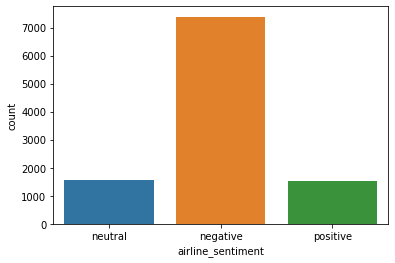

In [17]:
# Quick histogram of tweet classes

sns.countplot(x='airline_sentiment', data=kaggle_df);

###### Wordcloud for all labeled tweets

In [191]:
# Identify stop words before making wordcloud

stopwords_list = stopwords.words('english')
punc_list = list(string.punctuation)
stopwords_list += punc_list
str_ell_list = ["''", '""', '...', '``']
stopwords_list += str_ell_list

# Instantiate a wordcloud object

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords_list, 
                min_font_size = 10)

In [192]:
# Remove airline names and 'amp' for word cloud

kaggle_text_list = []
for tweet in kaggle_df.clean_text:
    tweet = clean_tweet(tweet, stop=True)
    tweet = re.sub("southwestair", "", tweet)
    tweet = re.sub("united", "", tweet)
    tweet = re.sub("americanair", "", tweet)
    tweet = re.sub("usairways", "", tweet)
    tweet = re.sub("jetblue", "", tweet)
    tweet = re.sub("virginamerica", "", tweet)
    tweet = re.sub("amp", "", tweet)
    tweet = re.sub("flight", "", tweet)
    tweet = re.sub(" s ", "", tweet)
    tweet = re.sub(" 2 ", "", tweet)
    kaggle_text_list.append(tweet)

kaggle_text = ' '.join(kaggle_text_list)

In [193]:
wordcloud.generate(kaggle_text)

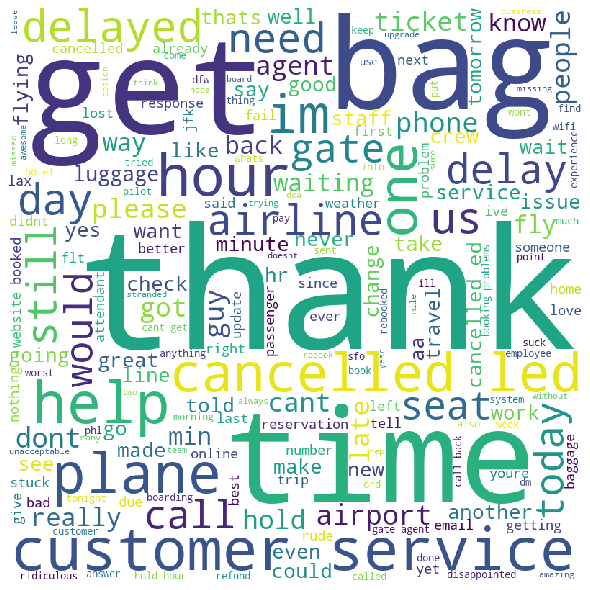

In [194]:
# plot the WordCloud image

plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show(); 

##### FreqDist plot for all labeled tweets

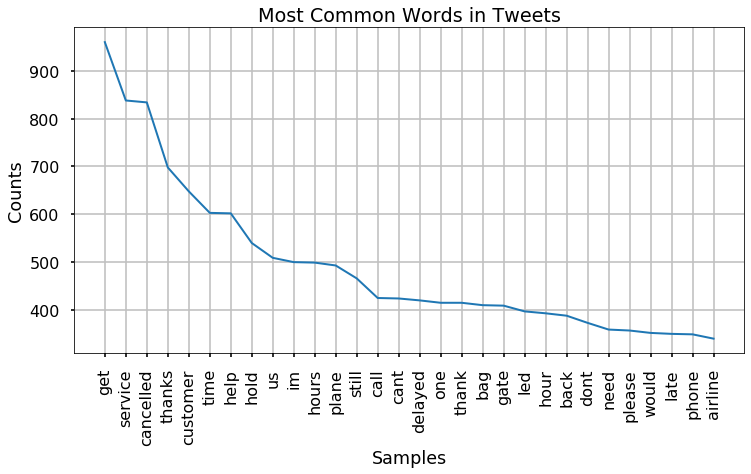

In [195]:
fd = FreqDist(word_tokenize(kaggle_text))
plt.figure(figsize=(12,6))
fd.plot(30, title='Most Common Words in Tweets')
plt.show();

###### Positive Tweets Wordcloud

In [196]:
kaggle_positive = kaggle_df[kaggle_df['airline_sentiment'] == 'positive']

In [197]:
kaggle_positive_list = []
for tweet in kaggle_positive.clean_text:
    tweet = clean_tweet(tweet, stop=True)
    tweet = re.sub("southwestair", "", tweet)
    tweet = re.sub("united", "", tweet)
    tweet = re.sub("americanair", "", tweet)
    tweet = re.sub("usairways", "", tweet)
    tweet = re.sub("jetblue", "", tweet)
    tweet = re.sub("virginamerica", "", tweet)
    tweet = re.sub("amp", "", tweet)
    tweet = re.sub("flight", "", tweet)
    tweet = re.sub(" s ", "", tweet)
    tweet = re.sub(" 2 ", "", tweet)
    kaggle_positive_list.append(tweet)

kaggle_positive_text = ' '.join(kaggle_positive_list)

In [198]:
wordcloud.generate(kaggle_positive_text)

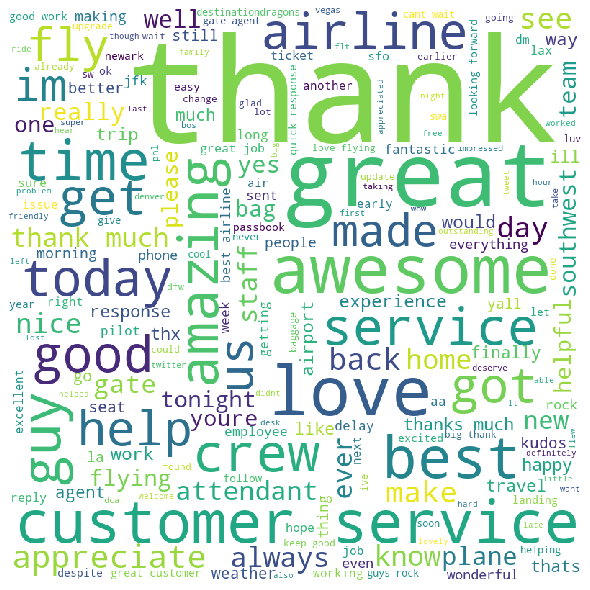

In [199]:
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show(); 

##### FreqDist plot for Positive tweets

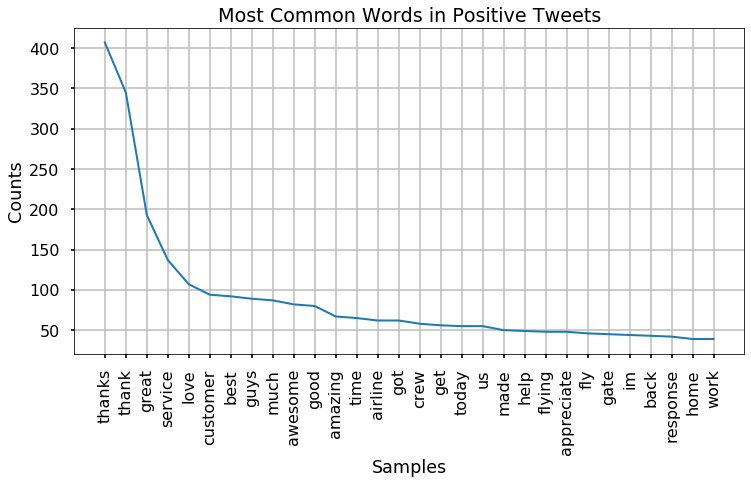

In [200]:
fd = FreqDist(word_tokenize(kaggle_positive_text))
plt.figure(figsize=(12,6))
fd.plot(30, title='Most Common Words in Positive Tweets')
plt.show();

###### Negative Tweets Wordcloud

In [201]:
kaggle_negative = kaggle_df[kaggle_df['airline_sentiment'] == 'negative']

In [202]:
kaggle_negative_list = []
for tweet in kaggle_negative.clean_text:
    tweet = clean_tweet(tweet, stop=True)
    tweet = re.sub("southwestair", "", tweet)
    tweet = re.sub("united", "", tweet)
    tweet = re.sub("americanair", "", tweet)
    tweet = re.sub("usairways", "", tweet)
    tweet = re.sub("jetblue", "", tweet)
    tweet = re.sub("virginamerica", "", tweet)
    tweet = re.sub("amp", "", tweet)
    tweet = re.sub("flight", "", tweet)
    tweet = re.sub(" s ", "", tweet)
    tweet = re.sub(" 2 ", "", tweet)
    kaggle_negative_list.append(tweet)

kaggle_negative_text = ' '.join(kaggle_negative_list)

In [203]:
wordcloud.generate(kaggle_negative_text)

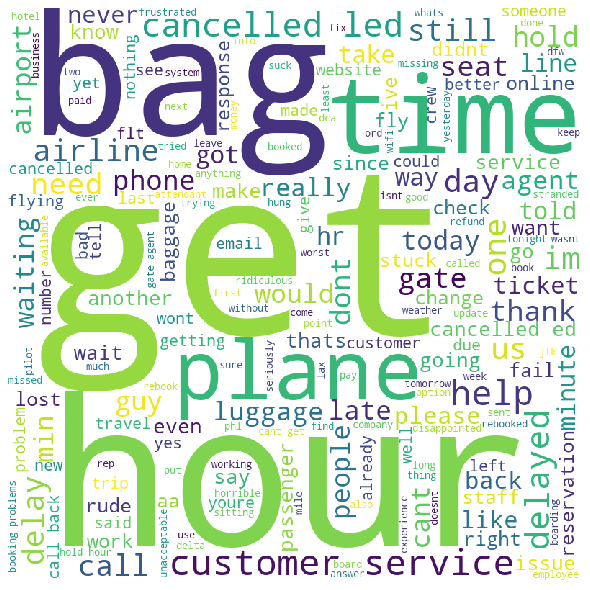

In [204]:
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show(); 

##### FreqDist for negative tweets

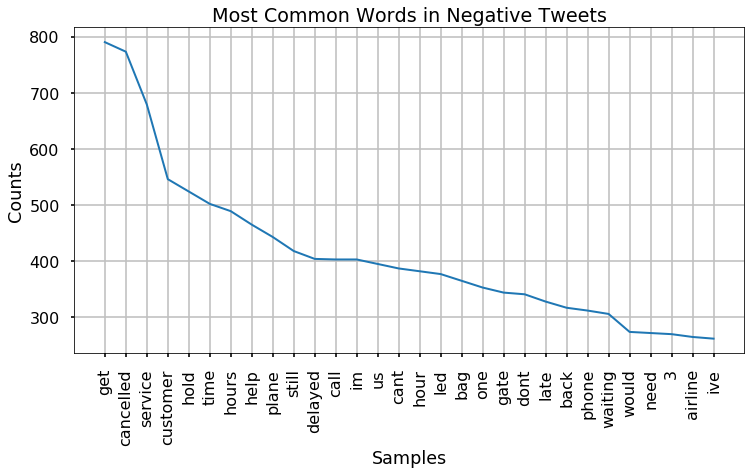

In [205]:
fd = FreqDist(word_tokenize(kaggle_negative_text))
plt.figure(figsize=(12,6))
fd.plot(30, title='Most Common Words in Negative Tweets')
plt.show();

###### Neutral Tweets Wordcloud

In [206]:
kaggle_neutral = kaggle_df[kaggle_df['airline_sentiment'] == 'neutral']

In [207]:
kaggle_neutral_list = []
for tweet in kaggle_neutral.clean_text:
    tweet = clean_tweet(tweet, stop=True)
    tweet = re.sub("southwestair", "", tweet)
    tweet = re.sub("united", "", tweet)
    tweet = re.sub("americanair", "", tweet)
    tweet = re.sub("usairways", "", tweet)
    tweet = re.sub("jetblue", "", tweet)
    tweet = re.sub("virginamerica", "", tweet)
    tweet = re.sub("amp", "", tweet)
    tweet = re.sub("flight", "", tweet)
    tweet = re.sub(" s ", "", tweet)
    tweet = re.sub(" 2 ", "", tweet)
    kaggle_neutral_list.append(tweet)

kaggle_neutral_text = ' '.join(kaggle_neutral_list)

In [208]:
wordcloud.generate(kaggle_neutral_text)

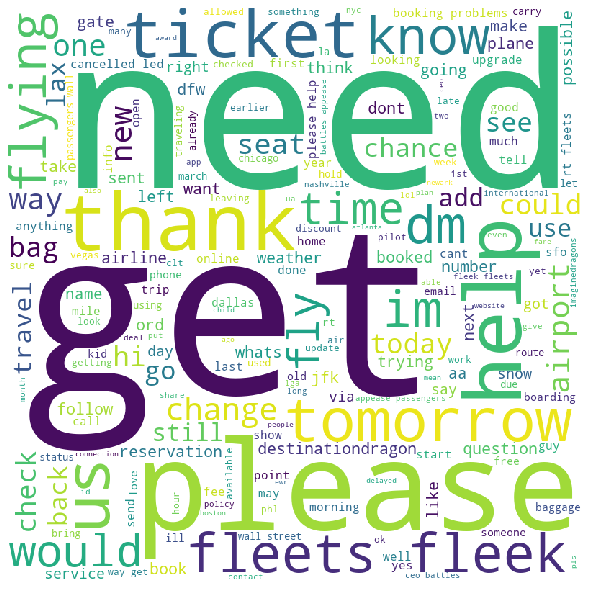

In [209]:
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show(); 

##### FreqDist plot for neutral tweets

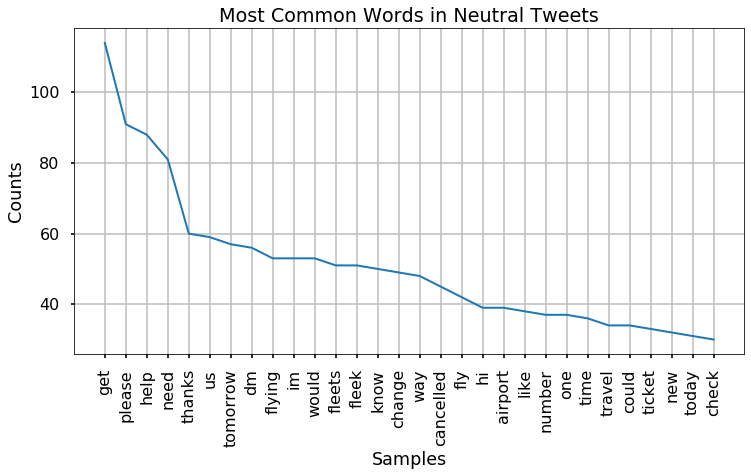

In [210]:
fd = FreqDist(word_tokenize(kaggle_neutral_text))
plt.figure(figsize=(12,6))
fd.plot(30, title='Most Common Words in Neutral Tweets')
plt.show();

# Model Part 1: Supervised Tf-idf Classifiers

##### Vectorization: 
TF-IDF

##### Classifiers:
LinearSVC, Random Forest, Multinomial NB, Adaboost, XGBoost, Neural Network

##### Data:

Kaggle labeled tweets

##### Train-Test Split: 
75% Training, 25% Testing

##### Evaluation:
Confusion Matrix, Classification Report, Accuracy Score

In [38]:
# Define X and y

X = kaggle_df.clean_text
y = kaggle_df.target

In [39]:
# Perform train test split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,
                                                    random_state=1)

In [40]:
# Vectorize data using tfidf vectorizer

vectorizer = TfidfVectorizer(max_features=100)
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

## LinearSVC Classifier

In [41]:
# Instantiate classifier, fit, and predict on test data

svm_clf = LinearSVC(random_state=1)
svm_clf.fit(X_train, y_train)
svm_test_pred = svm_clf.predict(X_test)

In [42]:
# Evaluate classifier performance

evaluate_clf(y_test, svm_test_pred)
svm_test_acc = round(accuracy_score(y_test, svm_test_pred), 2)

Confusion Matrix:
[[1757   56   21]
 [ 196  168   16]
 [ 153   44  201]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.96      0.89      1834
           1       0.63      0.44      0.52       380
           2       0.84      0.51      0.63       398

    accuracy                           0.81      2612
   macro avg       0.77      0.64      0.68      2612
weighted avg       0.81      0.81      0.80      2612

------------------------------------------------------------
Test Accuracy:
0.81


## Random Forest Model Classifier

In [43]:
# Instantiate classifier, fit, and predict on test data

rf_clf = RandomForestClassifier(random_state=1)
rf_clf.fit(X_train, y_train)
rf_test_pred = rf_clf.predict(X_test)

In [44]:
# Evaluate classifier performance

evaluate_clf(y_test, rf_test_pred)
rf_test_acc = round(accuracy_score(y_test, rf_test_pred), 2)

Confusion Matrix:
[[1749   52   33]
 [ 224  139   17]
 [ 150   44  204]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.95      0.88      1834
           1       0.59      0.37      0.45       380
           2       0.80      0.51      0.63       398

    accuracy                           0.80      2612
   macro avg       0.74      0.61      0.65      2612
weighted avg       0.79      0.80      0.78      2612

------------------------------------------------------------
Test Accuracy:
0.8


## Multinomial Naive Bayes Classifier

In [45]:
# Instantiate classifier, fit, and predict on test data

mnb_clf = MultinomialNB()
mnb_clf.fit(X_train, y_train)
mnb_test_pred = mnb_clf.predict(X_test)

In [46]:
# Evaluate classifier performance

evaluate_clf(y_test, mnb_test_pred)
mnb_test_acc = round(accuracy_score(y_test, mnb_test_pred), 2)

Confusion Matrix:
[[1828    0    6]
 [ 364   10    6]
 [ 276    1  121]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.74      1.00      0.85      1834
           1       0.91      0.03      0.05       380
           2       0.91      0.30      0.46       398

    accuracy                           0.75      2612
   macro avg       0.85      0.44      0.45      2612
weighted avg       0.79      0.75      0.67      2612

------------------------------------------------------------
Test Accuracy:
0.75


## AdaBoost Classifier

In [47]:
# Instantiate classifier, fit, and predict on test data

ada_clf = AdaBoostClassifier(random_state=1)
ada_clf.fit(X_train, y_train)
ada_test_pred = ada_clf.predict(X_test)

In [48]:
# Evaluate classifier performanceabs

evaluate_clf(y_test, ada_test_pred)
ada_test_acc = round(accuracy_score(y_test, ada_test_pred), 2)

Confusion Matrix:
[[1711   85   38]
 [ 190  169   21]
 [ 146   57  195]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.93      0.88      1834
           1       0.54      0.44      0.49       380
           2       0.77      0.49      0.60       398

    accuracy                           0.79      2612
   macro avg       0.72      0.62      0.66      2612
weighted avg       0.78      0.79      0.78      2612

------------------------------------------------------------
Test Accuracy:
0.79


## XGBoost Classifier

In [49]:
# Instantiate classifier, fit, and predict on test data

xgb_clf = XGBClassifier(random_state=1)
xgb_clf.fit(X_train, y_train)
xgb_test_pred = xgb_clf.predict(X_test)

In [50]:
# Evaluate classifier performance

evaluate_clf(y_test, xgb_test_pred)
xgb_test_acc = round(accuracy_score(y_test, xgb_test_pred), 2)

Confusion Matrix:
[[1788   31   15]
 [ 247  121   12]
 [ 172   39  187]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.97      0.88      1834
           1       0.63      0.32      0.42       380
           2       0.87      0.47      0.61       398

    accuracy                           0.80      2612
   macro avg       0.77      0.59      0.64      2612
weighted avg       0.79      0.80      0.78      2612

------------------------------------------------------------
Test Accuracy:
0.8


## Neural Network Classifier

In [51]:
# Define simple neural network model

model = Sequential()
model.add(Dense(100, input_dim=100, activation='relu'))
model.add(Dense(3, activation='softmax'))

# Compile model

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', 
              metrics=['accuracy'])

# Fit to training data
model.fit(X_train, y_train, epochs=5, batch_size=100, 
          validation_data=(X_test, y_test))

Train on 7833 samples, validate on 2612 samples
Epoch 1/5
7833/7833 [==============================] - 0s 30us/step - loss: 0.7976 - accuracy: 0.6917 - val_loss: 0.6856 - val_accuracy: 0.7071
Epoch 2/5
7833/7833 [==============================] - 0s 15us/step - loss: 0.6266 - accuracy: 0.7339 - val_loss: 0.5818 - val_accuracy: 0.7623
Epoch 3/5
7833/7833 [==============================] - 0s 15us/step - loss: 0.5409 - accuracy: 0.7888 - val_loss: 0.5160 - val_accuracy: 0.7967
Epoch 4/5
7833/7833 [==============================] - 0s 15us/step - loss: 0.5008 - accuracy: 0.8030 - val_loss: 0.4936 - val_accuracy: 0.8070
Epoch 5/5
7833/7833 [==============================] - 0s 14us/step - loss: 0.4858 - accuracy: 0.8088 - val_loss: 0.4871 - val_accuracy: 0.8151


In [52]:
# Make predictions on test data

nn_test_pred = model.predict_classes(X_test)

# Evaluate classifier performance

evaluate_clf(y_test, nn_test_pred)
nn_test_acc = round(accuracy_score(y_test, nn_test_pred), 2)

Confusion Matrix:
[[1735   65   34]
 [ 176  175   29]
 [ 133   46  219]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.95      0.89      1834
           1       0.61      0.46      0.53       380
           2       0.78      0.55      0.64       398

    accuracy                           0.82      2612
   macro avg       0.75      0.65      0.69      2612
weighted avg       0.80      0.82      0.80      2612

------------------------------------------------------------
Test Accuracy:
0.82


## Model Part 1 Summary:

In [53]:
# Create classifier summary table

models = ['Linear SVC', 'Random Forest', 'Multinomial Naive Bayes', 
                  'AdaBoost', 'XGBoost', 'Neural Network']

tfidf_model_accs = [svm_test_acc, rf_test_acc, mnb_test_acc, ada_test_acc,
                    xgb_test_acc, nn_test_acc]

tfidf_summary = pd.DataFrame([models, tfidf_model_accs]).T

tfidf_summary.columns = ['Classifier', 'Tfidf Accuracy']

tfidf_summary

,Classifier,Tfidf Accuracy
0,Linear SVC,0.81
1,Random Forest,0.8
2,Multinomial Naive Bayes,0.75
3,AdaBoost,0.79
4,XGBoost,0.8
5,Neural Network,0.82


Using TF-IDF as a vectorizer, the simple Neural Network performed as the best classifier with 82% accuracy, closely followed by LinearSVC (81%).

Multinomial NB was the worst performing classifier with TF-IDF, at 75% accuracy.

# Model Part 2: Supervised Doc2Vec Classifiers

##### Vectorization: 
Doc2Vec

##### Classifiers:
LinearSVC, Random Forest, Multinomial NB, Adaboost, XGBoost, Neural Network

##### Data:
Kaggle labeled tweets

##### Train-Test Split: 
75% Training, 25% Testing

##### Evaluation:
Confusion Matrix, Classification Report, Accuracy Score

## Fit Doc2Vec Model on labeled data

In [54]:
# Create list of kaggle tokenized tweets

kaggle_tokens = list(kaggle_df['tokens'])

In [55]:
# Need to tag data for doc2vec model

tagged_data = [
    TaggedDocument(
        words=tweet, tags=[str(i)])for i, tweet in enumerate(kaggle_tokens)
]

In [56]:
# Instantiate Doc2Vec model and build model vocabulary from tweet data

model = Doc2Vec(vector_size=100, dm=1, epochs=100)

model.build_vocab(tagged_data)

In [57]:
# Train the model on labeled tweets

model.train(tagged_data, total_examples=model.corpus_count,
            epochs=model.epochs)

In [58]:
# Now, must use trained model to infer vectors for all kaggle labeled tweets

kaggle_vecs = []
for tweet in kaggle_df.tokens:
    vec = model.infer_vector(tweet)
    kaggle_vecs.append(vec)

kaggle_vecs = np.array(kaggle_vecs)

In [59]:
# Define X and y for the d2v models

y = kaggle_df.target
X = kaggle_vecs

In [60]:
# Perform train test split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,
                                                    random_state=1)

## LinearSVC Classifier - Supervised d2v

In [61]:
# Instantiate classifier, fit, and predict on test data

svm_sd2v = LinearSVC(random_state=1, max_iter=5000)
svm_sd2v.fit(X_train, y_train)
svm_sd2v_test_pred = svm_sd2v.predict(X_test)

In [62]:
# Evaluate classifier performance

evaluate_clf(y_test, svm_sd2v_test_pred)
svm_sd2v_test_acc = round(accuracy_score(y_test, svm_sd2v_test_pred), 2)

Confusion Matrix:
[[1716   51   67]
 [ 255   94   31]
 [ 178   22  198]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.94      0.86      1834
           1       0.56      0.25      0.34       380
           2       0.67      0.50      0.57       398

    accuracy                           0.77      2612
   macro avg       0.68      0.56      0.59      2612
weighted avg       0.74      0.77      0.74      2612

------------------------------------------------------------
Test Accuracy:
0.77


## Random Forest Model Classifier - Supervised d2v

In [63]:
# Instantiate classifier, fit, and predict on test data

rf_sd2v_clf = RandomForestClassifier(random_state=1)
rf_sd2v_clf.fit(X_train, y_train)
rf_sd2v_test_pred = rf_sd2v_clf.predict(X_test)

In [64]:
# Evaluate classifier

evaluate_clf(y_test, rf_sd2v_test_pred)
rf_sd2v_test_acc = round(accuracy_score(y_test, rf_sd2v_test_pred), 2)

Confusion Matrix:
[[1818   14    2]
 [ 322   49    9]
 [ 303   10   85]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.99      0.85      1834
           1       0.67      0.13      0.22       380
           2       0.89      0.21      0.34       398

    accuracy                           0.75      2612
   macro avg       0.77      0.44      0.47      2612
weighted avg       0.76      0.75      0.68      2612

------------------------------------------------------------
Test Accuracy:
0.75


## Multinomial Naive Bayes Classifier - Supervised d2v

In [65]:
# Need to MinMax Scale X data for MNB Classifier

scaler = MinMaxScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)

In [66]:
# Instantiate classifier, fit, and predict on test data 

mnb_sd2v_clf = MultinomialNB()
mnb_sd2v_clf.fit(X_train_sc, y_train)
mnb_sd2v_test_pred = mnb_sd2v_clf.predict(X_test_sc)

In [67]:
# Evaluate classifier performance

evaluate_clf(y_test, mnb_sd2v_test_pred)
mnb_sd2v_test_acc = round(accuracy_score(y_test, mnb_sd2v_test_pred), 2)

Confusion Matrix:
[[1834    0    0]
 [ 380    0    0]
 [ 398    0    0]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.70      1.00      0.83      1834
           1       0.00      0.00      0.00       380
           2       0.00      0.00      0.00       398

    accuracy                           0.70      2612
   macro avg       0.23      0.33      0.28      2612
weighted avg       0.49      0.70      0.58      2612

------------------------------------------------------------
Test Accuracy:
0.7


C:\Users\dougl\Anaconda3\envs\learn-env\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## AdaBoost Classifier - Supervised d2v

In [68]:
# Instantiate classifier, fit, predict on test data

ada_sd2v_clf = AdaBoostClassifier(random_state=1)
ada_sd2v_clf.fit(X_train, y_train)
ada_sd2v_test_pred = ada_sd2v_clf.predict(X_test)

In [69]:
# Evaluate classifier performance

evaluate_clf(y_test, ada_sd2v_test_pred)
ada_sd2v_test_acc = round(accuracy_score(y_test, ada_sd2v_test_pred), 2)

Confusion Matrix:
[[1693   78   63]
 [ 208  120   52]
 [ 173   51  174]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.92      0.87      1834
           1       0.48      0.32      0.38       380
           2       0.60      0.44      0.51       398

    accuracy                           0.76      2612
   macro avg       0.63      0.56      0.58      2612
weighted avg       0.74      0.76      0.74      2612

------------------------------------------------------------
Test Accuracy:
0.76


## XGBoost Classifier - Supervised d2v

In [70]:
# Instantiate classifier, fit, and predict on test data

xgb_sd2v_clf = XGBClassifier(random_state=1)
xgb_sd2v_clf.fit(X_train, y_train)
xgb_sd2v_test_pred = xgb_sd2v_clf.predict(X_test)

In [71]:
# Evaluate classifier performance

evaluate_clf(y_test, xgb_sd2v_test_pred)
xgb_sd2v_test_acc = round(accuracy_score(y_test, xgb_sd2v_test_pred), 2)

Confusion Matrix:
[[1787   33   14]
 [ 271   90   19]
 [ 224   29  145]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.97      0.87      1834
           1       0.59      0.24      0.34       380
           2       0.81      0.36      0.50       398

    accuracy                           0.77      2612
   macro avg       0.73      0.53      0.57      2612
weighted avg       0.76      0.77      0.74      2612

------------------------------------------------------------
Test Accuracy:
0.77


## Perceptron Classifier - Supervised d2v

In [72]:
# Define the keras model

percep_sd2v = Sequential()
percep_sd2v.add(Dense(100, input_dim=100, activation='relu'))
percep_sd2v.add(Dense(3, activation='softmax'))

# compile the keras model

percep_sd2v.compile(loss='sparse_categorical_crossentropy', optimizer='adam', 
                    metrics=['accuracy'])

# fit the keras model on the dataset

percep_sd2v.fit(X_train, y_train, epochs=5, batch_size=100, 
                validation_data=(X_test, y_test))

Train on 7833 samples, validate on 2612 samples
Epoch 1/5
7833/7833 [==============================] - 0s 20us/step - loss: 0.7116 - accuracy: 0.6992 - val_loss: 0.6009 - val_accuracy: 0.7504
Epoch 2/5
7833/7833 [==============================] - 0s 11us/step - loss: 0.5460 - accuracy: 0.7753 - val_loss: 0.5357 - val_accuracy: 0.7879
Epoch 3/5
7833/7833 [==============================] - 0s 11us/step - loss: 0.4927 - accuracy: 0.8038 - val_loss: 0.5116 - val_accuracy: 0.8017
Epoch 4/5
7833/7833 [==============================] - 0s 12us/step - loss: 0.4626 - accuracy: 0.8225 - val_loss: 0.5049 - val_accuracy: 0.8051
Epoch 5/5
7833/7833 [==============================] - 0s 13us/step - loss: 0.4424 - accuracy: 0.8317 - val_loss: 0.4984 - val_accuracy: 0.8067


In [73]:
# Make predictions on test data

nn_sd2v_test_pred = percep_sd2v.predict_classes(X_test)

# Evaluate classifier performance

evaluate_clf(y_test, nn_sd2v_test_pred)
nn_sd2v_test_acc = round(accuracy_score(y_test, nn_sd2v_test_pred), 2)

Confusion Matrix:
[[1686   93   55]
 [ 181  174   25]
 [ 113   38  247]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.92      0.88      1834
           1       0.57      0.46      0.51       380
           2       0.76      0.62      0.68       398

    accuracy                           0.81      2612
   macro avg       0.73      0.67      0.69      2612
weighted avg       0.80      0.81      0.80      2612

------------------------------------------------------------
Test Accuracy:
0.81


## Model Part 2 Summary:

In [74]:
# Update and display summary table

sd2v_model_accs = [svm_sd2v_test_acc, rf_sd2v_test_acc, mnb_sd2v_test_acc, 
                   ada_sd2v_test_acc, xgb_sd2v_test_acc, nn_sd2v_test_acc]

tfidf_summary['Supervised d2v Accuracy'] = sd2v_model_accs

summary_table = tfidf_summary

display(summary_table)

,Classifier,Tfidf Accuracy,Supervised d2v Accuracy
0,Linear SVC,0.81,0.77
1,Random Forest,0.8,0.75
2,Multinomial Naive Bayes,0.75,0.70
3,AdaBoost,0.79,0.76
4,XGBoost,0.8,0.77
5,Neural Network,0.82,0.81


Using doc2vec embeddings trained on the Kaggle labeled data, the neural network is the best performing classifier at 81%. This accuracy is slightly less than that achieved by the neural network using TF-IDF vectorization.

# Model Part 3: Semi-Supervised Doc2Vec Classifiers

##### Vectorization: 
Doc2Vec

##### Classifiers:
LinearSVC, Random Forest, Multinomial NB, Adaboost, XGBoost, Neural Network

##### Data:
Twitter unlabeled tweets & kaggle labeled tweets (for the unsupervised task of generating Doc2Vec embeddings)

Kaggle labeled tweets (for the classification task)

##### Train-Test Split: 
75% Training, 25% Testing

##### Evaluation:
Confusion Matrix, Classification Report, Accuracy Score

## Fit Doc2Vec Model on labeled & unlabeled data

In [75]:
kaggle_tokens = kaggle_df['tokens']

In [76]:
twitter_tokens = twitter_df['tokens']

In [77]:
# Combine all tokenized tweets to train Doc2Vec on all available data

all_tokens = list(kaggle_tokens.append(twitter_tokens))

In [78]:
tagged_data = [TaggedDocument(
    words=tweet, tags=[str(i)])for i, tweet in enumerate(all_tokens)]

In [79]:
# Instantiate Doc2Vec model and build model vocabulary from tweet data

model = Doc2Vec(vector_size=100, dm=1, epochs=100)

model.build_vocab(tagged_data)

In [80]:
# Train the model on full text data (ok to use all unlabled and labeled data)

model.train(tagged_data, total_examples=model.corpus_count, 
            epochs=model.epochs)

In [81]:
# Now, must use trained model to infer vectors for all kaggle labeled tweets

kaggle_vecs = []
for tweet in kaggle_df.tokens:
    vec = model.infer_vector(tweet)
    kaggle_vecs.append(vec)

In [82]:
# Coerce word embeddings to numpy array

kaggle_vecs = np.array(kaggle_vecs)

In [83]:
y = kaggle_df.target
X = kaggle_vecs

In [84]:
# Perform Train-Test-Split on the data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1)

## LinearSVC Classifier - Semi-Supervised d2v

In [85]:
# Instantiate classifier, fit, and predict on test data

svm_ssd2v = LinearSVC(random_state=1, max_iter=10000)
svm_ssd2v.fit(X_train, y_train)
svm_ssd2v_test_pred = svm_ssd2v.predict(X_test)

In [86]:
# Evaluate classifier

evaluate_clf(y_test, svm_ssd2v_test_pred)
svm_ssd2v_test_acc = round(accuracy_score(y_test, svm_ssd2v_test_pred), 2)

Confusion Matrix:
[[1732   53   49]
 [ 216  132   32]
 [ 123   32  243]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.94      0.89      1834
           1       0.61      0.35      0.44       380
           2       0.75      0.61      0.67       398

    accuracy                           0.81      2612
   macro avg       0.73      0.63      0.67      2612
weighted avg       0.79      0.81      0.79      2612

------------------------------------------------------------
Test Accuracy:
0.81


## Random Forest Model Classifier - Semi-Supervised d2v

In [87]:
# Instantiate classifier, fit, and predict on test data

rf_ssd2v_clf = RandomForestClassifier(random_state=1)
rf_ssd2v_clf.fit(X_train, y_train)
rf_ssd2v_test_pred = rf_ssd2v_clf.predict(X_test)

In [88]:
# Evaluate classifier

evaluate_clf(y_test, rf_ssd2v_test_pred)
rf_ssd2v_test_acc = round(accuracy_score(y_test, rf_ssd2v_test_pred), 2)

Confusion Matrix:
[[1822   10    2]
 [ 341   34    5]
 [ 313   11   74]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.99      0.85      1834
           1       0.62      0.09      0.16       380
           2       0.91      0.19      0.31       398

    accuracy                           0.74      2612
   macro avg       0.76      0.42      0.44      2612
weighted avg       0.75      0.74      0.66      2612

------------------------------------------------------------
Test Accuracy:
0.74


## Multinomial Naive Bayes Classifier - Semi-Supervised d2v

In [89]:
# Scale data to pass to MNB algorithm

scaler = MinMaxScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)

In [90]:
# Instantiate classifier, fit, and predict on test data

mnb_ssd2v_clf = MultinomialNB()
mnb_ssd2v_clf.fit(X_train_sc, y_train)
mnb_ssd2v_test_pred = mnb_ssd2v_clf.predict(X_test_sc)

In [91]:
# Evaluate classifier

evaluate_clf(y_test, mnb_ssd2v_test_pred)
mnb_ssd2v_test_acc = round(accuracy_score(y_test, mnb_ssd2v_test_pred), 2)

Confusion Matrix:
[[1834    0    0]
 [ 380    0    0]
 [ 398    0    0]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.70      1.00      0.83      1834
           1       0.00      0.00      0.00       380
           2       0.00      0.00      0.00       398

    accuracy                           0.70      2612
   macro avg       0.23      0.33      0.28      2612
weighted avg       0.49      0.70      0.58      2612

------------------------------------------------------------
Test Accuracy:
0.7


C:\Users\dougl\Anaconda3\envs\learn-env\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## AdaBoost Classifier - Semi-Supervised d2v

In [92]:
# Instantiate classifier, fit, predict on test data

ada_ssd2v_clf = AdaBoostClassifier(random_state=1)
ada_ssd2v_clf.fit(X_train, y_train)
ada_ssd2v_test_pred = ada_ssd2v_clf.predict(X_test)

In [93]:
# Evaluate classifier

evaluate_clf(y_test, ada_ssd2v_test_pred)
ada_ssd2v_test_acc = round(accuracy_score(y_test, ada_ssd2v_test_pred), 2)

Confusion Matrix:
[[1702   73   59]
 [ 233   99   48]
 [ 164   45  189]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.93      0.87      1834
           1       0.46      0.26      0.33       380
           2       0.64      0.47      0.54       398

    accuracy                           0.76      2612
   macro avg       0.64      0.55      0.58      2612
weighted avg       0.73      0.76      0.74      2612

------------------------------------------------------------
Test Accuracy:
0.76


## XGBoost Classifier - Semi-Supervised d2v

In [94]:
# Instantiate classifier, fit, predict on test data

xgb_ssd2v_clf = XGBClassifier(random_state=1)
xgb_ssd2v_clf.fit(X_train, y_train)
xgb_ssd2v_test_pred = xgb_ssd2v_clf.predict(X_test)

In [95]:
# Evaluate classifier

evaluate_clf(y_test, xgb_ssd2v_test_pred)
xgb_ssd2v_test_acc = round(accuracy_score(y_test, xgb_ssd2v_test_pred), 2)

Confusion Matrix:
[[1790   34   10]
 [ 270   93   17]
 [ 229   25  144]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.98      0.87      1834
           1       0.61      0.24      0.35       380
           2       0.84      0.36      0.51       398

    accuracy                           0.78      2612
   macro avg       0.75      0.53      0.57      2612
weighted avg       0.77      0.78      0.74      2612

------------------------------------------------------------
Test Accuracy:
0.78


## Perceptron Classifier - Semi-Supervised d2v

In [96]:
# define the keras model

percep_ssd2v = Sequential()
percep_ssd2v.add(Dense(100, input_dim=100, activation='relu'))
percep_ssd2v.add(Dense(3, activation='softmax'))

# compile the keras model

percep_ssd2v.compile(loss='sparse_categorical_crossentropy', optimizer='adam', 
                     metrics=['accuracy'])

# fit the keras model on the dataset

percep_ssd2v.fit(X_train, y_train, epochs=5, batch_size=100, 
                 validation_data=(X_test, y_test))

# predict on test data

nn_ssd2v_test_pred = percep_ssd2v.predict_classes(X_test)

Train on 7833 samples, validate on 2612 samples
Epoch 1/5
7833/7833 [==============================] - 0s 19us/step - loss: 0.6919 - accuracy: 0.7033 - val_loss: 0.5700 - val_accuracy: 0.7734
Epoch 2/5
7833/7833 [==============================] - 0s 12us/step - loss: 0.5182 - accuracy: 0.7917 - val_loss: 0.5080 - val_accuracy: 0.8139
Epoch 3/5
7833/7833 [==============================] - 0s 11us/step - loss: 0.4683 - accuracy: 0.8173 - val_loss: 0.4813 - val_accuracy: 0.8224
Epoch 4/5
7833/7833 [==============================] - 0s 12us/step - loss: 0.4399 - accuracy: 0.8297 - val_loss: 0.4720 - val_accuracy: 0.8281
Epoch 5/5
7833/7833 [==============================] - 0s 11us/step - loss: 0.4173 - accuracy: 0.8379 - val_loss: 0.4623 - val_accuracy: 0.8323


In [97]:
# Evaluate classifier

evaluate_clf(y_test, nn_ssd2v_test_pred)
nn_ssd2v_test_acc = round(accuracy_score(y_test, nn_ssd2v_test_pred), 2)

Confusion Matrix:
[[1735   54   45]
 [ 185  166   29]
 [  94   31  273]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.95      0.90      1834
           1       0.66      0.44      0.53       380
           2       0.79      0.69      0.73       398

    accuracy                           0.83      2612
   macro avg       0.77      0.69      0.72      2612
weighted avg       0.82      0.83      0.82      2612

------------------------------------------------------------
Test Accuracy:
0.83


## Model Part 3 Summary:

In [98]:
# Update summary table

ssd2v_model_accs = [svm_ssd2v_test_acc, rf_ssd2v_test_acc, mnb_ssd2v_test_acc, 
                    ada_ssd2v_test_acc, xgb_ssd2v_test_acc, nn_ssd2v_test_acc]

summary_table['Semi-Supervised d2v Accuracy'] = ssd2v_model_accs


display(summary_table)

,Classifier,Tfidf Accuracy,Supervised d2v Accuracy,Semi-Supervised d2v Accuracy
0,Linear SVC,0.81,0.77,0.81
1,Random Forest,0.8,0.75,0.74
2,Multinomial Naive Bayes,0.75,0.70,0.70
3,AdaBoost,0.79,0.76,0.76
4,XGBoost,0.8,0.77,0.78
5,Neural Network,0.82,0.81,0.83


The neural network is the best performing classifier using doc2vec embeddings at 82%.

Including the ~41.5k unlabeled tweets while fitting the unsupervised doc2vec model generally seemed to slightly improve classification accuracy as opposed to when only labeled Kaggle tweets were used for doc2vec.

# Model Part 4: GloVe Word Embedding Classifiers - 100d

##### Vectorization: 
GloVe embeddings (100d per word, pre-trained on corpus of 2 billion tweets)

Mean embeddings are then calculated using the words present in each tweet

##### Classifiers:
LinearSVC, Random Forest, Multinomial NB, Adaboost, XGBoost, Neural Network

##### Data:
Kaggle labeled tweets

##### Train-Test Split: 
75% Training, 25% Testing

##### Evaluation:
Confusion Matrix, Classification Report, Accuracy Score

## Get GloVe Embeddings for Labeled Tweets

In [99]:
# Get Labeled tweets vocabulary

total_vocabulary = set(word for tweet in kaggle_df.tokens for word in tweet)

len(total_vocabulary)
print('There are {} unique tokens in the dataset.'.format(
    len(total_vocabulary)))

There are 12285 unique tokens in the dataset.


In [100]:
# See available files for GloVe

os.listdir("C:/Users/dougl/glove.twitter.27B/")

['glove.twitter.27B.100d.txt',
 'glove.twitter.27B.200d.txt',
 'glove.twitter.27B.25d.txt',
 'glove.twitter.27B.50d.txt']

In [101]:
# Get 100d GloVe embeddings for each word present in the vocabulary

glove = {}
with open(r'C:/Users/dougl/glove.twitter.27B/glove.twitter.27B.100d.txt', 'rb') as f:
    for line in f:
        parts = line.split()
        word = parts[0].decode('utf-8')
        if word in total_vocabulary:
            vector = np.array(parts[1:], dtype=np.float32)
            glove[word] = vector

In [102]:
# Check length of glove dictionary relative to total words

print(f'{len(glove)} of {len(total_vocabulary)} \
    tokens in dataset matched in GloVe and vectorized!')

8332 of 12285     tokens in dataset matched in GloVe and vectorized!


## W2vVectorizer class to get GloVe mean word embeddings for tweets

In [103]:
# Instantiate a mean word embedding vectorizer using glove embeddings

vectorizer = W2vVectorizer(glove)

In [104]:
# Use vectorizer to transform tokenized data to vectors

X_glove = vectorizer.transform(kaggle_df.tokens)

In [105]:
# Check to see if X_glove is correct shape
# Should be # of observations (10445) by # word emb. dimension (100)

X_glove.shape

(10445, 100)

In [106]:
# Get corresponding y

y = kaggle_df.target

y.shape

(10445,)

In [107]:
# Perform train test split on data

X_train, X_test, y_train, y_test = train_test_split(X_glove, y, 
                                                    test_size=0.25, 
                                                    random_state=1)

## LinearSVC Classifier - GloVe Mean Word Embeddings

In [108]:
# Instantiate classifier, fit, and predict on test data

svm_glove = LinearSVC(random_state=1, max_iter=10000)
svm_glove.fit(X_train, y_train)
svm_glove_test_pred = svm_glove.predict(X_test)

In [109]:
# Evaluate classifier

evaluate_clf(y_test, svm_glove_test_pred)
svm_glove_test_acc = round(accuracy_score(y_test, svm_glove_test_pred), 2)

Confusion Matrix:
[[1783   23   28]
 [ 186  170   24]
 [  66   28  304]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.97      0.92      1834
           1       0.77      0.45      0.57       380
           2       0.85      0.76      0.81       398

    accuracy                           0.86      2612
   macro avg       0.83      0.73      0.76      2612
weighted avg       0.86      0.86      0.85      2612

------------------------------------------------------------
Test Accuracy:
0.86


## Random Forest Classifier - GloVe Mean Word Embeddings

In [110]:
# Instantiate classifier, fit, and predict on test data

rf_glove = RandomForestClassifier(random_state=1)
rf_glove.fit(X_train, y_train)
rf_glove_test_pred = rf_glove.predict(X_test)

In [111]:
# Evaluate classifier

evaluate_clf(y_test, rf_glove_test_pred)
rf_glove_test_acc = round(accuracy_score(y_test, rf_glove_test_pred), 2)

Confusion Matrix:
[[1805   18   11]
 [ 226  135   19]
 [ 149   19  230]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.98      0.90      1834
           1       0.78      0.36      0.49       380
           2       0.88      0.58      0.70       398

    accuracy                           0.83      2612
   macro avg       0.83      0.64      0.70      2612
weighted avg       0.83      0.83      0.81      2612

------------------------------------------------------------
Test Accuracy:
0.83


## Multinomial Naive Bayes Classifier - GloVe Mean Word Embeddings

In [112]:
# Scale data to pass to MNB algorithm

scaler = MinMaxScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)

In [113]:
# Instantiate classifier, fit, and predict on test data

mnb_glove_clf = MultinomialNB()
mnb_glove_clf.fit(X_train_sc, y_train)
mnb_glove_test_pred = mnb_glove_clf.predict(X_test_sc)

In [114]:
# Evaluate classifier

evaluate_clf(y_test, mnb_glove_test_pred)
mnb_glove_test_acc = round(accuracy_score(y_test, mnb_glove_test_pred), 2)

Confusion Matrix:
[[1834    0    0]
 [ 380    0    0]
 [ 398    0    0]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.70      1.00      0.83      1834
           1       0.00      0.00      0.00       380
           2       0.00      0.00      0.00       398

    accuracy                           0.70      2612
   macro avg       0.23      0.33      0.28      2612
weighted avg       0.49      0.70      0.58      2612

------------------------------------------------------------
Test Accuracy:
0.7


C:\Users\dougl\Anaconda3\envs\learn-env\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## AdaBoost Classifier - GloVe Mean Word Embeddings

In [115]:
# Instantiate classifier, fit, and predict on test data

ada_glove_clf = AdaBoostClassifier(random_state=1)
ada_glove_clf.fit(X_train, y_train)
ada_glove_test_pred = ada_glove_clf.predict(X_test)

In [116]:
# Evaluate classifier

evaluate_clf(y_test, ada_glove_test_pred)
ada_glove_test_acc = round(accuracy_score(y_test, ada_glove_test_pred), 2)

Confusion Matrix:
[[1709   71   54]
 [ 175  182   23]
 [  81   37  280]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      1834
           1       0.63      0.48      0.54       380
           2       0.78      0.70      0.74       398

    accuracy                           0.83      2612
   macro avg       0.76      0.70      0.73      2612
weighted avg       0.82      0.83      0.82      2612

------------------------------------------------------------
Test Accuracy:
0.83


## XGBoost Classifier - GloVe Mean Word Embeddings

In [117]:
# Instantiate classifier, fit, and predict on test data

xgb_glove_clf = XGBClassifier(random_state=1)
xgb_glove_clf.fit(X_train, y_train)
xgb_glove_test_pred = xgb_glove_clf.predict(X_test)

In [118]:
# Evaluate classifier

evaluate_clf(y_test, xgb_glove_test_pred)
xgb_glove_test_acc = round(accuracy_score(y_test, xgb_glove_test_pred), 2)

Confusion Matrix:
[[1783   32   19]
 [ 185  173   22]
 [ 102   27  269]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.97      0.91      1834
           1       0.75      0.46      0.57       380
           2       0.87      0.68      0.76       398

    accuracy                           0.85      2612
   macro avg       0.82      0.70      0.75      2612
weighted avg       0.85      0.85      0.84      2612

------------------------------------------------------------
Test Accuracy:
0.85


## Perceptron Classifier - GloVe Word Embeddings

In [119]:
# define the keras model

percep_glove = Sequential()
percep_glove.add(Dense(100, input_dim=100, activation='relu'))
percep_glove.add(Dense(3, activation='softmax'))

# compile the keras model

percep_glove.compile(loss='sparse_categorical_crossentropy', optimizer='adam', 
                     metrics=['accuracy'])

# fit the keras model on the dataset

percep_glove.fit(X_train, y_train, epochs=5, batch_size=100, 
                 validation_data=(X_test, y_test))

# Predict on test data

nn_glove_test_pred = percep_glove.predict_classes(X_test)

Train on 7833 samples, validate on 2612 samples
Epoch 1/5
7833/7833 [==============================] - 0s 19us/step - loss: 0.7728 - accuracy: 0.6635 - val_loss: 0.5452 - val_accuracy: 0.7860
Epoch 2/5
7833/7833 [==============================] - 0s 11us/step - loss: 0.4927 - accuracy: 0.8204 - val_loss: 0.4297 - val_accuracy: 0.8480
Epoch 3/5
7833/7833 [==============================] - 0s 12us/step - loss: 0.4296 - accuracy: 0.8408 - val_loss: 0.3924 - val_accuracy: 0.8629
Epoch 4/5
7833/7833 [==============================] - 0s 11us/step - loss: 0.4027 - accuracy: 0.8537 - val_loss: 0.3762 - val_accuracy: 0.8664
Epoch 5/5
7833/7833 [==============================] - 0s 12us/step - loss: 0.3860 - accuracy: 0.8600 - val_loss: 0.3684 - val_accuracy: 0.8679


In [120]:
# Evaluate classifier

evaluate_clf(y_test, nn_glove_test_pred)
nn_glove_test_acc = round(accuracy_score(y_test, nn_glove_test_pred), 2)

Confusion Matrix:
[[1789   19   26]
 [ 185  167   28]
 [  69   18  311]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.98      0.92      1834
           1       0.82      0.44      0.57       380
           2       0.85      0.78      0.82       398

    accuracy                           0.87      2612
   macro avg       0.85      0.73      0.77      2612
weighted avg       0.86      0.87      0.86      2612

------------------------------------------------------------
Test Accuracy:
0.87


## Model Part 4 Summary

In [121]:
# Update summary table

glove_model_accs = [svm_glove_test_acc, rf_glove_test_acc, mnb_glove_test_acc, 
                    ada_glove_test_acc, xgb_glove_test_acc, nn_glove_test_acc]

summary_table['GloVe Accuracy - 100d'] = glove_model_accs


display(summary_table)

,Classifier,Tfidf Accuracy,Supervised d2v Accuracy,Semi-Supervised d2v Accuracy,GloVe Accuracy - 100d
0,Linear SVC,0.81,0.77,0.81,0.86
1,Random Forest,0.8,0.75,0.74,0.83
2,Multinomial Naive Bayes,0.75,0.70,0.70,0.70
3,AdaBoost,0.79,0.76,0.76,0.83
4,XGBoost,0.8,0.77,0.78,0.85
5,Neural Network,0.82,0.81,0.83,0.87


Using GloVe 100d mean embeddings as input to classification models results in marked improvement over the TF-IDF and Doc2vec methods. The neural network and LinearSVC classifiers both achieved 87% classification accuracy.

# Model Part 5: GloVe Embedding Classifiers - 200d

##### Vectorization: 
GloVe embeddings (200d per word, pre-trained on corpus of 2 billion tweets)

Mean embeddings are then calculated using the words present in each tweet

##### Classifiers:
LinearSVC, Random Forest, Multinomial NB, Adaboost, XGBoost, Neural Network

##### Data:
Kaggle labeled tweets

##### Train-Test Split: 
75% Training, 25% Testing

##### Evaluation:
Confusion Matrix, Classification Report, Accuracy Score

## Get GloVe Embeddings for Labeled Tweets

In [122]:
# Get labeled tweets vocabulary

total_vocabulary = set(word for tweet in kaggle_df.tokens for word in tweet)

len(total_vocabulary)
print('There are {} unique tokens in the dataset.'.format(len(
    total_vocabulary)))

There are 12285 unique tokens in the dataset.


In [123]:
# See available files for GloVe

os.listdir("C:/Users/dougl/glove.twitter.27B/")

['glove.twitter.27B.100d.txt',
 'glove.twitter.27B.200d.txt',
 'glove.twitter.27B.25d.txt',
 'glove.twitter.27B.50d.txt']

In [124]:
# Get GloVe embeddings for each word present in the vocabulary

glove_200 = {}
with open(r'C:/Users/dougl/glove.twitter.27B/glove.twitter.27B.200d.txt', 'rb') as f:
    for line in f:
        parts = line.split()
        word = parts[0].decode('utf-8')
        if word in total_vocabulary:
            vector = np.array(parts[1:], dtype=np.float32)
            glove_200[word] = vector

In [125]:
# Check length of glove dictionary 

print(f'{len(glove_200)} of {len(total_vocabulary)} \
    tokens in dataset matched in GloVe and vectorized!')

8332 of 12285     tokens in dataset matched in GloVe and vectorized!


## Get GloVe mean word embeddings for tweets

In [126]:
# Instantiate a mean word embedding vectorizer using glove embeddings

vectorizer_200 = W2vVectorizer(glove_200)

In [127]:
# Use vectorizer to transform tokenized data to vectors

X_glove_200 = vectorizer_200.transform(kaggle_df.tokens)

In [128]:
# Check to see if X_glove is correct shape
# Should be # of observations (10445) by # word emb. dimension (200)

X_glove_200.shape

(10445, 200)

In [129]:
# Get corresponding y

y = kaggle_df.target

y.shape

(10445,)

In [130]:
# Perform train test split on data

X_train, X_test, y_train, y_test = train_test_split(X_glove_200, y, 
                                                    test_size=0.25, 
                                                    random_state=1)

## LinearSVC Classifier - GloVe 200d

In [131]:
# Instantiate classifier, fit, and predict on test data

svm_glove_200 = LinearSVC(random_state=1, max_iter=10000)
svm_glove_200.fit(X_train, y_train)
svm_glove_200_test_pred = svm_glove_200.predict(X_test)

In [132]:
# Evaluate classifier

evaluate_clf(y_test, svm_glove_200_test_pred)
svm_glove_200_test_acc = round(accuracy_score(y_test, 
                                              svm_glove_200_test_pred), 2)

Confusion Matrix:
[[1774   32   28]
 [ 135  222   23]
 [  54   27  317]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.97      0.93      1834
           1       0.79      0.58      0.67       380
           2       0.86      0.80      0.83       398

    accuracy                           0.89      2612
   macro avg       0.85      0.78      0.81      2612
weighted avg       0.88      0.89      0.88      2612

------------------------------------------------------------
Test Accuracy:
0.89


## Random Forest Classifier - GloVe 200d

In [133]:
# Instantiate classifier, fit, predict on test data

rf_glove_200 = RandomForestClassifier(random_state=1)
rf_glove_200.fit(X_train, y_train)
rf_glove_200_test_pred = rf_glove_200.predict(X_test)

In [134]:
# Evaluate classifier

evaluate_clf(y_test, rf_glove_200_test_pred)
rf_glove_200_test_acc = round(accuracy_score(y_test, rf_glove_200_test_pred), 
                              2)

Confusion Matrix:
[[1809   16    9]
 [ 235  124   21]
 [ 159   17  222]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.99      0.90      1834
           1       0.79      0.33      0.46       380
           2       0.88      0.56      0.68       398

    accuracy                           0.83      2612
   macro avg       0.83      0.62      0.68      2612
weighted avg       0.83      0.83      0.80      2612

------------------------------------------------------------
Test Accuracy:
0.83


## Multinomial Naive Bayes Classifier - GloVe 200d

In [135]:
# Scale data to pass to MNB algorithm

scaler = MinMaxScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)

In [136]:
# Instantiate classifier, fit, and predict on test data

mnb_glove_200 = MultinomialNB()
mnb_glove_200.fit(X_train_sc, y_train)
mnb_glove_200_test_pred = mnb_glove_200.predict(X_test_sc)

In [137]:
# Evaluate classifier

evaluate_clf(y_test, mnb_glove_200_test_pred)
mnb_glove_200_test_acc = round(accuracy_score(y_test, 
                                              mnb_glove_200_test_pred), 2)

Confusion Matrix:
[[1834    0    0]
 [ 380    0    0]
 [ 385    0   13]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83      1834
           1       0.00      0.00      0.00       380
           2       1.00      0.03      0.06       398

    accuracy                           0.71      2612
   macro avg       0.57      0.34      0.30      2612
weighted avg       0.65      0.71      0.59      2612

------------------------------------------------------------
Test Accuracy:
0.71


C:\Users\dougl\Anaconda3\envs\learn-env\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## AdaBoost Classifier - GloVe 200d

In [138]:
# Instantiate classifier, fit, and predict on test data

ada_glove_200 = AdaBoostClassifier(random_state=1)
ada_glove_200.fit(X_train, y_train)
ada_glove_200_test_pred = ada_glove_200.predict(X_test)

In [139]:
# Evaluate classifier

evaluate_clf(y_test, ada_glove_200_test_pred)
ada_glove_200_test_acc = round(accuracy_score(y_test, 
                                              ada_glove_200_test_pred), 2)

Confusion Matrix:
[[1719   68   47]
 [ 168  175   37]
 [  81   34  283]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      1834
           1       0.63      0.46      0.53       380
           2       0.77      0.71      0.74       398

    accuracy                           0.83      2612
   macro avg       0.76      0.70      0.73      2612
weighted avg       0.82      0.83      0.83      2612

------------------------------------------------------------
Test Accuracy:
0.83


## XGBoost Classifier - GloVe 200d

In [140]:
# Instantiate classifier, fit, predict on test data

xgb_glove_200 = XGBClassifier(random_state=1)
xgb_glove_200.fit(X_train, y_train)
xgb_glove_200_test_pred = xgb_glove_200.predict(X_test)

In [141]:
# Evaluate classifier

evaluate_clf(y_test, xgb_glove_200_test_pred)
xgb_glove_200_test_acc = round(accuracy_score(y_test, 
                                              xgb_glove_200_test_pred), 2)

Confusion Matrix:
[[1796   25   13]
 [ 182  171   27]
 [  94   19  285]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      1834
           1       0.80      0.45      0.57       380
           2       0.88      0.72      0.79       398

    accuracy                           0.86      2612
   macro avg       0.85      0.72      0.76      2612
weighted avg       0.86      0.86      0.85      2612

------------------------------------------------------------
Test Accuracy:
0.86


## Perceptron Classifier - GloVe 200d

In [142]:
# define the keras model

percep_glove_200 = Sequential()
percep_glove_200.add(Dense(100, input_dim=200, activation='relu'))
percep_glove_200.add(Dense(3, activation='softmax'))

# compile the keras model

percep_glove_200.compile(loss='sparse_categorical_crossentropy', 
                         optimizer='adam', metrics=['accuracy'])

# fit the keras model on the dataset

percep_glove_200.fit(X_train, y_train, epochs=5, batch_size=100, 
                     validation_data=(X_test, y_test))

# Predict on test data

nn_glove_200_test_pred = percep_glove_200.predict_classes(X_test)

Train on 7833 samples, validate on 2612 samples
Epoch 1/5
7833/7833 [==============================] - 0s 50us/step - loss: 0.6660 - accuracy: 0.7365 - val_loss: 0.4999 - val_accuracy: 0.8055
Epoch 2/5
7833/7833 [==============================] - 0s 18us/step - loss: 0.4524 - accuracy: 0.8326 - val_loss: 0.3918 - val_accuracy: 0.8622
Epoch 3/5
7833/7833 [==============================] - 0s 15us/step - loss: 0.3885 - accuracy: 0.8577 - val_loss: 0.3665 - val_accuracy: 0.8832
Epoch 4/5
7833/7833 [==============================] - 0s 16us/step - loss: 0.3630 - accuracy: 0.8679 - val_loss: 0.3406 - val_accuracy: 0.8848
Epoch 5/5
7833/7833 [==============================] - 0s 16us/step - loss: 0.3428 - accuracy: 0.8782 - val_loss: 0.3324 - val_accuracy: 0.8894


In [143]:
# Evaluate classifier

evaluate_clf(y_test, nn_glove_200_test_pred)
nn_glove_200_test_acc = round(accuracy_score(y_test, nn_glove_200_test_pred), 
                              2)

Confusion Matrix:
[[1767   42   25]
 [ 121  241   18]
 [  54   29  315]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.96      0.94      1834
           1       0.77      0.63      0.70       380
           2       0.88      0.79      0.83       398

    accuracy                           0.89      2612
   macro avg       0.85      0.80      0.82      2612
weighted avg       0.89      0.89      0.89      2612

------------------------------------------------------------
Test Accuracy:
0.89


## Model Part 5 Summary

In [144]:
# Update summary table

glove_200_model_accs = [svm_glove_200_test_acc, rf_glove_200_test_acc, 
                        mnb_glove_200_test_acc, ada_glove_200_test_acc, 
                        xgb_glove_200_test_acc, nn_glove_200_test_acc]

summary_table['GloVe Accuracy - 200d'] = glove_200_model_accs


display(summary_table)

,Classifier,Tfidf Accuracy,Supervised d2v Accuracy,Semi-Supervised d2v Accuracy,GloVe Accuracy - 100d,GloVe Accuracy - 200d
0,Linear SVC,0.81,0.77,0.81,0.86,0.89
1,Random Forest,0.8,0.75,0.74,0.83,0.83
2,Multinomial Naive Bayes,0.75,0.70,0.70,0.70,0.71
3,AdaBoost,0.79,0.76,0.76,0.83,0.83
4,XGBoost,0.8,0.77,0.78,0.85,0.86
5,Neural Network,0.82,0.81,0.83,0.87,0.89


Increasing the dimesions for GloVe from 100d to 200d resulted in an increase in classification accuracy for LinearSVC (88%), Multinomial NB (71%), and neural network (89%). 

# Model Part 6: GloVe + d2v Classifiers

##### Vectorization: 

Concatenation of:

- GloVe embeddings (200d per word, pre-trained on corpus of 2 billion tweets)

- Doc2Vec

##### Classifiers:
LinearSVC, Random Forest, Multinomial NB, Adaboost, XGBoost, Neural Network

##### Data:
Twitter unlabeled tweets & kaggle labeled tweets (for the unsupervised task of generating Doc2Vec embeddings)

Kaggle labeled tweets (for the classification task)

##### Train-Test Split: 
75% Training, 25% Testing

##### Evaluation:
Confusion Matrix, Classification Report, Accuracy Score

## Get GloVe Embeddings

In [145]:
# Get weets vocabulary (full - labeled and unlabeled)

tokens = kaggle_df['tokens'].append(twitter_df['tokens'])
full_vocabulary = set(word for tweet in tokens for word in tweet)

len(full_vocabulary)
print('There are {} unique tokens in the dataset.'.format(
    len(full_vocabulary)))

There are 53437 unique tokens in the dataset.


In [146]:
# See available files for GloVe

os.listdir("C:/Users/dougl/glove.twitter.27B/")

['glove.twitter.27B.100d.txt',
 'glove.twitter.27B.200d.txt',
 'glove.twitter.27B.25d.txt',
 'glove.twitter.27B.50d.txt']

In [147]:
# Get GloVe embeddings for each word present in the vocabulary

glove_full = {}
with open(r'C:/Users/dougl/glove.twitter.27B/glove.twitter.27B.200d.txt', 'rb') as f:
    for line in f:
        parts = line.split()
        word = parts[0].decode('utf-8')
        if word in full_vocabulary:
            vector = np.array(parts[1:], dtype=np.float32)
            glove_full[word] = vector

In [148]:
# Check length of glove dictionary (number of words in GloVe matched by word in corpus)

print(f'{len(glove_full)} of {len(full_vocabulary)} tokens in dataset matched in GloVe and vectorized!')

25077 of 53437 tokens in dataset matched in GloVe and vectorized!


## Get GloVe mean word embeddings

In [149]:
# Instantiate a mean word embedding vectorizer using glove embeddings

vectorizer_full = W2vVectorizer(glove_full)

In [150]:
# Use vectorizer to transform tokenized data to vectors

X_glove = vectorizer_full.transform(kaggle_df.tokens)

In [151]:
X_d2v = kaggle_vecs

In [152]:
# Combine GloVe and d2v embeddings for final X dataset

X_g_d2v = np.concatenate((X_glove, X_d2v), axis=1)

In [153]:
# Perform train test split on data

X_train, X_test, y_train, y_test = train_test_split(X_g_d2v, y, 
                                                    test_size=0.25, 
                                                    random_state=1)

## LinearSVC Classifier - GloVe + d2v

In [154]:
# Instantiate classifier, fit, predict on test data

svm_gd2v = LinearSVC(random_state=1, max_iter=10000)
svm_gd2v.fit(X_train, y_train)
svm_gd2v_test_pred = svm_gd2v.predict(X_test)

In [155]:
# Evaluate classifier

evaluate_clf(y_test, svm_gd2v_test_pred)
svm_gd2v_test_acc = round(accuracy_score(y_test, svm_gd2v_test_pred), 2)

Confusion Matrix:
[[1765   37   32]
 [ 122  234   24]
 [  44   29  325]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.96      0.94      1834
           1       0.78      0.62      0.69       380
           2       0.85      0.82      0.83       398

    accuracy                           0.89      2612
   macro avg       0.85      0.80      0.82      2612
weighted avg       0.89      0.89      0.89      2612

------------------------------------------------------------
Test Accuracy:
0.89


## Random Forest Classifier - GloVe + d2v

In [156]:
# Instantiate classifier, fit, predict on test data

rf_gd2v = RandomForestClassifier(random_state=1)
rf_gd2v.fit(X_train, y_train)
rf_gd2v_test_pred = rf_gd2v.predict(X_test)

In [157]:
# Evaluate classifier

evaluate_clf(y_test, rf_gd2v_test_pred)
rf_gd2v_test_acc = round(accuracy_score(y_test, rf_gd2v_test_pred), 2)

Confusion Matrix:
[[1814   14    6]
 [ 251  114   15]
 [ 187    6  205]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.99      0.89      1834
           1       0.85      0.30      0.44       380
           2       0.91      0.52      0.66       398

    accuracy                           0.82      2612
   macro avg       0.85      0.60      0.66      2612
weighted avg       0.83      0.82      0.79      2612

------------------------------------------------------------
Test Accuracy:
0.82


## Multinomial Naive Bayes Classifier - GloVe + d2v

In [158]:
# Scale data to pass to MNB algorithm

scaler = MinMaxScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)

In [159]:
# Instantiate classifier, fit, and predict on test data

mnb_gd2v = MultinomialNB()
mnb_gd2v.fit(X_train_sc, y_train)
mnb_gd2v_test_pred = mnb_gd2v.predict(X_test_sc)

In [160]:
# Evaluate classifier

evaluate_clf(y_test, mnb_gd2v_test_pred)
mnb_gd2v_test_acc = round(accuracy_score(y_test, mnb_gd2v_test_pred), 2)

Confusion Matrix:
[[1834    0    0]
 [ 380    0    0]
 [ 385    0   13]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83      1834
           1       0.00      0.00      0.00       380
           2       1.00      0.03      0.06       398

    accuracy                           0.71      2612
   macro avg       0.57      0.34      0.30      2612
weighted avg       0.65      0.71      0.59      2612

------------------------------------------------------------
Test Accuracy:
0.71


C:\Users\dougl\Anaconda3\envs\learn-env\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## AdaBoost Classifier - GloVe + d2v

In [161]:
# Instantiate classifier, fit, and predict on test data

ada_gd2v = AdaBoostClassifier(random_state=1)
ada_gd2v.fit(X_train, y_train)
ada_gd2v_test_pred = ada_gd2v.predict(X_test)

In [162]:
# Evaluate classifier

evaluate_clf(y_test, ada_gd2v_test_pred)
ada_gd2v_test_acc = round(accuracy_score(y_test, ada_gd2v_test_pred), 2)

Confusion Matrix:
[[1698   79   57]
 [ 171  166   43]
 [  75   32  291]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      1834
           1       0.60      0.44      0.51       380
           2       0.74      0.73      0.74       398

    accuracy                           0.83      2612
   macro avg       0.74      0.70      0.71      2612
weighted avg       0.81      0.83      0.82      2612

------------------------------------------------------------
Test Accuracy:
0.83


## XGBoost Classifier - GloVe + d2v

In [163]:
# Instantiate classifier, fit, predict on test data

xgb_gd2v = XGBClassifier(random_state=1)
xgb_gd2v.fit(X_train, y_train)
xgb_gd2v_test_pred = xgb_gd2v.predict(X_test)

In [164]:
# Evaluate classifier

evaluate_clf(y_test, xgb_gd2v_test_pred)
xgb_gd2v_test_acc = round(accuracy_score(y_test, xgb_gd2v_test_pred), 2)

Confusion Matrix:
[[1795   22   17]
 [ 176  179   25]
 [  92   22  284]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      1834
           1       0.80      0.47      0.59       380
           2       0.87      0.71      0.78       398

    accuracy                           0.86      2612
   macro avg       0.85      0.72      0.77      2612
weighted avg       0.86      0.86      0.85      2612

------------------------------------------------------------
Test Accuracy:
0.86


## Perceptron Classifier - GloVe + d2v

In [165]:
# define the keras model

percep_gd2v = Sequential()
percep_gd2v.add(Dense(100, input_dim=300, activation='relu'))
percep_gd2v.add(Dense(3, activation='softmax'))

# compile the keras model

percep_gd2v.compile(loss='sparse_categorical_crossentropy', optimizer='adam', 
                    metrics=['accuracy'])

# fit the keras model on the dataset

percep_gd2v.fit(X_train, y_train, epochs=5, batch_size=100, 
                validation_data=(X_test, y_test))

# predict on test data

nn_gd2v_test_pred = percep_gd2v.predict_classes(X_test)

Train on 7833 samples, validate on 2612 samples
Epoch 1/5
7833/7833 [==============================] - 0s 27us/step - loss: 0.6100 - accuracy: 0.7504 - val_loss: 0.4348 - val_accuracy: 0.8415
Epoch 2/5
7833/7833 [==============================] - 0s 19us/step - loss: 0.3998 - accuracy: 0.8502 - val_loss: 0.3714 - val_accuracy: 0.8706
Epoch 3/5
7833/7833 [==============================] - 0s 18us/step - loss: 0.3487 - accuracy: 0.8704 - val_loss: 0.3529 - val_accuracy: 0.8737
Epoch 4/5
7833/7833 [==============================] - 0s 19us/step - loss: 0.3193 - accuracy: 0.8801 - val_loss: 0.3419 - val_accuracy: 0.8786
Epoch 5/5
7833/7833 [==============================] - 0s 17us/step - loss: 0.2950 - accuracy: 0.8911 - val_loss: 0.3404 - val_accuracy: 0.8798


In [166]:
# Evaluate classifier

evaluate_clf(y_test, nn_gd2v_test_pred)
nn_gd2v_test_acc = round(accuracy_score(y_test, nn_gd2v_test_pred), 2)

Confusion Matrix:
[[1720   77   37]
 [ 108  246   26]
 [  42   24  332]]
------------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.94      0.93      1834
           1       0.71      0.65      0.68       380
           2       0.84      0.83      0.84       398

    accuracy                           0.88      2612
   macro avg       0.82      0.81      0.81      2612
weighted avg       0.88      0.88      0.88      2612

------------------------------------------------------------
Test Accuracy:
0.88


## Model Part 6 Summary

In [167]:
# Update summary table

gd2v_model_accs = [svm_gd2v_test_acc, rf_gd2v_test_acc, mnb_gd2v_test_acc, 
                   ada_gd2v_test_acc, xgb_gd2v_test_acc, nn_gd2v_test_acc]

summary_table['GloVe + d2v Accuracy'] = gd2v_model_accs


display(summary_table)

,Classifier,Tfidf Accuracy,Supervised d2v Accuracy,Semi-Supervised d2v Accuracy,GloVe Accuracy - 100d,GloVe Accuracy - 200d,GloVe + d2v Accuracy
0,Linear SVC,0.81,0.77,0.81,0.86,0.89,0.89
1,Random Forest,0.8,0.75,0.74,0.83,0.83,0.82
2,Multinomial Naive Bayes,0.75,0.70,0.70,0.70,0.71,0.71
3,AdaBoost,0.79,0.76,0.76,0.83,0.83,0.83
4,XGBoost,0.8,0.77,0.78,0.85,0.86,0.86
5,Neural Network,0.82,0.81,0.83,0.87,0.89,0.88


Including doc2vec embeddings with GloVe mean word embeddings slightly improves accuracy for some classifiers (LinearSVC - 89%, AdaBoost - 83%, XGBoost - 87%), and decreases accuracy for others (Random Forest - 81%, neural network - 88%).

# Conclusions

1. The best classification accuracy achieved with respect to whether an airline-related tweet is positive, negative, or neutral is 89%, using either of the following methods:

    - Simple Neural Network Classifier using GloVe 200d pre-trained mean word embeddings
    
    - LinearSVC using Glove 200d pre-trained mean word embeddings and Doc2Vec embeddings

2) Positive tweets often contain words of gratitude or compliments:

    -'thanks', 'thank', 'great', 'love', 'service', 'customer', 'best', 'guys', 'much', 'awesome', 'crew'

3) Negative tweets often contain words referring to a cancellation or some kind of time delay:

    -'cancelled', 'service', 'hours', 'hold', 'customer', 'time', 'help', 'plane', 'delay'
    
4) Neutral tweets often contain words signaling a request for information or answer to a question:

    -'get', 'please', 'help', 'need', 'us', 'thanks', 'tomorrow', 'dm', 'would', 'flying'

5) Some aspects of tweet language are very difficult for NLP/ML classification:

    -Sarcasm:
    
    E.g. "@VirginAmerica husband and I ordered three drinks via my screen and they never came. Awesome!"
    
    -Negative tweets that contain some positive words:
    
    E.g. "@JetBlue I appreciate the credit for my troubles but the lack of personal response troubles me."

# Recommendations

1) Airline companies should incorporate a twitter sentiment classifier into their customer service plans to more efficiently address customer concerns, questions, opinions, compliments, etc.

2) NLP can be used to identify words most commonly appearing in positive, negative, and neutral tweets about an airline company. This can provide insight into what a company is doing right and wrong from a customer's perspective.
    
    -Positive: words of gratitude, good customer service
    
    -Negative: words concerning time waiting, delayed/canelled flights, bad customer service
    
    -Neutral: requests for information, questions

3) Twitter sentiment classifiers are most effective when using GloVe pre-trained word vectors. Since GloVe vectors are trained on 2 billion tweets, they capture more information than can be obtained by training a Doc2Vec model from scratch on a smaller corpus of unlabeled tweets (~41.5k unlabeled tweets used in this study).

# Appendix

##### Plot summary barplot of classifier accuracy

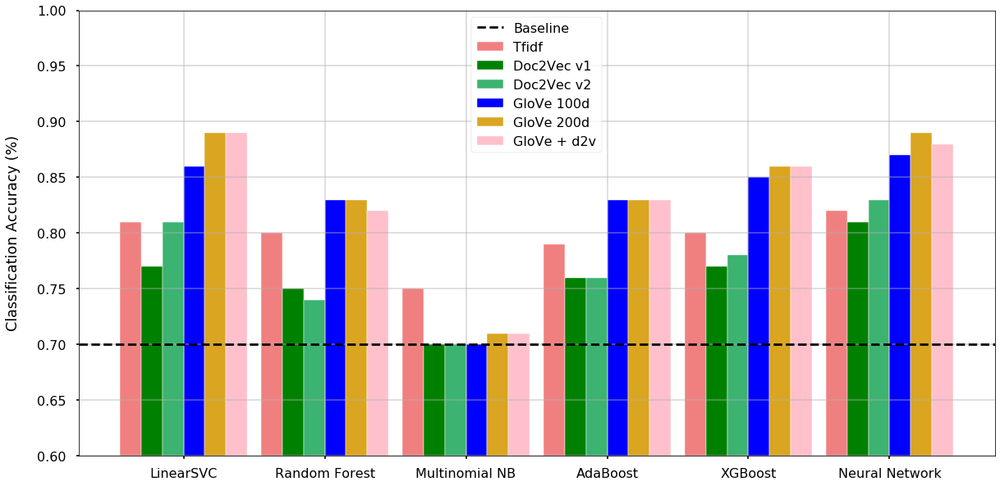

In [211]:

barWidth = 0.15
 
# set height of bar
bars1 = summary_table['Tfidf Accuracy']
bars2 = summary_table['Supervised d2v Accuracy']
bars3 = summary_table['Semi-Supervised d2v Accuracy']
bars4 = summary_table['GloVe Accuracy - 100d']
bars5 = summary_table['GloVe Accuracy - 200d']
bars6 = summary_table['GloVe + d2v Accuracy']
 
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
r6 = [x + barWidth for x in r5]

plt.figure(figsize=(20,10))

# Make the plot
plt.style.use('seaborn-poster')
plt.bar(r1, bars1, color='lightcoral', width=barWidth, edgecolor='white', 
        label='Tfidf')
plt.bar(r2, bars2, color='green', width=barWidth, edgecolor='white', 
        label='Doc2Vec v1')
plt.bar(r3, bars3, color='mediumseagreen', width=barWidth, edgecolor='white', 
        label='Doc2Vec v2')
plt.bar(r4, bars4, color='blue', width=barWidth, edgecolor='white', 
        label='GloVe 100d')
plt.bar(r5, bars5, color='goldenrod', width=barWidth, edgecolor='white', 
        label='GloVe 200d')
plt.bar(r6, bars6, color='pink', width=barWidth, edgecolor='white', 
        label='GloVe + d2v')

# Plot baseline
plt.axhline(y=0.7, label='Baseline', linestyle='--', color='black')
plt.ylabel('Classification Accuracy (%)', labelpad=20)
# Add xticks on the middle of the group bars
plt.xticks([r + 2.5*barWidth for r in range(len(bars1))], 
           ['LinearSVC', 'Random Forest', 'Multinomial NB',
            'AdaBoost', 'XGBoost', 'Neural Network'])
plt.ylim((0.6,1))

# Create legend & Show graphic
plt.legend()
plt.grid(alpha=0.5)
plt.show();


##### Take a closer look at which tweets are being classified incorrectly

In [169]:
svm_gd2v_pred_all = svm_gd2v.predict(X_g_d2v)

In [170]:
len(svm_gd2v_pred_all)

10445

In [171]:
kaggle_df['pred_label'] = svm_gd2v_pred_all

In [172]:
misclass_tweets = kaggle_df[kaggle_df['target'] != kaggle_df['pred_label']]

In [173]:
# Get negative tweets that were classified as positive

neg_as_pos_df = misclass_tweets[(misclass_tweets['target'] == 0) & (misclass_tweets['pred_label'] == 2)]

In [174]:
for text in neg_as_pos_df.text:
    print(text)

@VirginAmerica amazing to me that we can't get any cold air from the vents. #VX358 #noair #worstflightever #roasted #SFOtoBOS
@VirginAmerica I’m having trouble adding this flight my wife booked to my Elevate account. Help? http://t.co/pX8hQOKS3R
@VirginAmerica called your service line and was hung up on. This is awesome. #sarcasm
@VirginAmerica husband and I ordered three drinks via my screen and they never came. Awesome!
@VirginAmerica on flight VX399 headed to LA from JFK - dirtiest VA plane I have ever been on. Sad for a great airline.
@united Lovely new plane from LGA to ORD but no power outlets?
@united Not a happy flyer.  UA flight 1161 from SFO to Cleveland.  Sunday 2/22.  Stay tuned for blog article from http://t.co/VdFdODqVGx
@united sitting in a plane with no pilot.  Thanks! #waitingonapilot #denver #siouxfalls #whyairtravelsucks
@united I paid for economy plus and you put me in the last boarding group so I have to gate check my bags too? @VirginAmerica knows better..
@united

###### Confusion matrix plot for best performing model

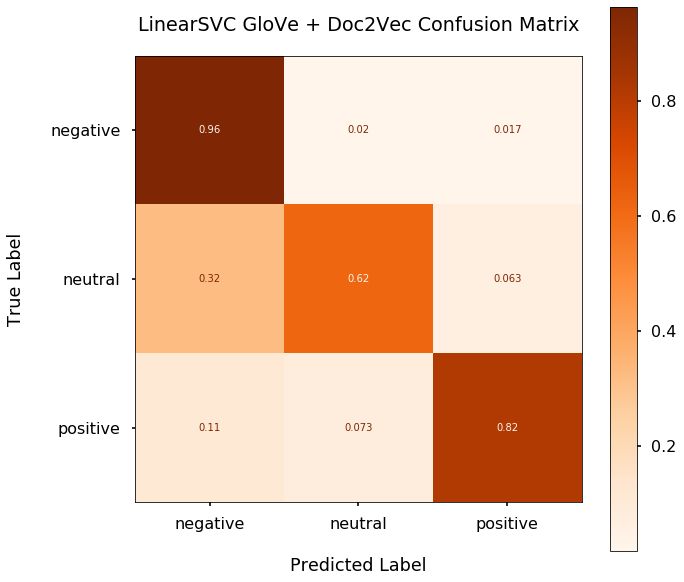

In [216]:
fig, ax = plt.subplots(figsize=(10, 10))
plot_confusion_matrix(svm_gd2v, X_test, y_test, cmap='Oranges', 
                      display_labels=sentiment_key.values(),
                      normalize='true', ax=ax)
ax.set_title('LinearSVC GloVe + Doc2Vec Confusion Matrix', pad=25)
ax.set_xlabel(xlabel='Predicted Label', labelpad=25)
ax.set_ylabel(ylabel='True Label', labelpad=25);